# SPRING FLOOD ANALYSIS

1. Click box below and choose sheet in excel that you want to do an analysis for.
2. Click on Cell -> Run All

In [96]:
#Choosing LTM model
# Norg, Sver, LTM1,..LTM8, LTMS
sheet = 'LTM1'

In [97]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
if (code_show){
$('div.input').hide();
} else {
$('div.input').show();
}
code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')



In [98]:
import sys

path = '\\\\energycorp\\applications\\OSL\\jupyter_notebooks\\personalfolders\\MEHO\\spring-flod-analysis'
sys.path.insert(0, path)

import modules as m

%load_ext autoreload
%autoreload 2

print('\n------------------------------------------------------------------------------------------------------\n')
print('                                                  {}                                                '.format(sheet))
print('\n------------------------------------------------------------------------------------------------------\n')
file = r'spring_flod_analysis.xlsx'

#Read and print dates for when saved models started from
m.saved_runs_excel(file)

#Reading comments etc from Excel file: 'Etteranalyse_snow_LTM.xlsx'
all_keys, vhhQ_OBSE_list, comments_list, excluded_list, start_list, end_list = m.main_read_excel(sheet, file)
    
#Reading in all keys from SMG
all_df, all_resources = m.read_timeseries(all_keys, vhhQ_OBSE_list, sheet)

#Making new df for all models for analyis period
df_analysis_period, resources_analysis_period, start_info_list, end_info_list, df_analysis1_list, start_analysis1_list, df_analysis2_list, start_analysis2_list = m.df_analysis_periods(all_df, all_resources, start_list, end_list, sheet)

#Excluding columns that are chosen to be excluded in the Excel document
df_for_analysis, keys_for_analysis = m.exclude_keys(df_analysis_period, all_keys, excluded_list)

#Calculating performance of the models
acc_perf_all, R2_perf_all = m.calc_performance(df_for_analysis, keys_for_analysis)



if sheet == 'Norg':
    acc_perf = acc_perf_all.drop('Norge')
elif sheet == 'Sver':
    acc_perf = acc_perf_all.drop('Sverige')
else:
    acc_perf = acc_perf_all
    
m.summary_table(df_analysis_period, all_keys, sheet)



The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload

------------------------------------------------------------------------------------------------------

                                                  LTM1                                                

------------------------------------------------------------------------------------------------------

Time saved models were started from:
REF1: 2019-01-01 00:00:00
TEMP1: 2019-04-04 00:00:00
TEMP2: TEMP day-1d day



,OBSE,REF,TEMP1,TEMP2,LTM,NORMAL
Atnasjø-002.032,228,10.9,10.9,10.9,10.8,15.8
Borgai.-015.053,19.9,1.4,1.4,1.4,1.3,-2.2
Eggedal-012.178,157.5,18.3,18.3,18.3,19,8.6
Etna-012.007,186.5,51.2,51.2,42.1,25.4,-20
Fiskum-012.193,9.9,-0.6,-0.6,-0.6,-0.6,-3.3
Grunke-012.197,132.4,54.9,54.9,38.9,38.8,4.3
Knappom-002.014,256.8,25.4,25.4,25.4,24.9,15.1
Kråkfos-002.279,87,-8.4,-8.4,-8.4,-9.2,-12.2
Liavatn-002.275,278.6,12,12,12,13.8,15
Magnor-313.010,55.3,3.8,3.8,3.8,3.8,-12.3


## BOX AND WHISKER PLOT ACCUMULATIVE DEVIATION FROM Q_OBSE

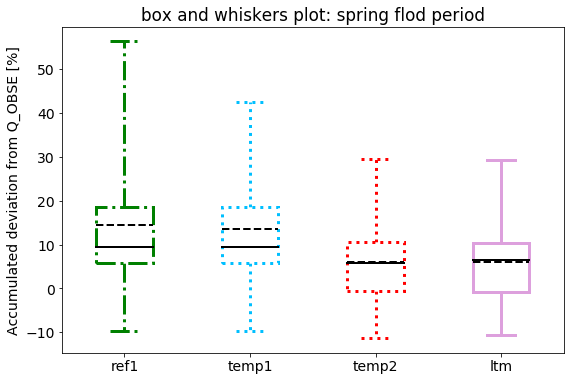

In [ ]:
m.box_plot(acc_perf)

# Performance According to Accumulated Deviation from Q_OBSE
## ADJUSTMENTS: BETTER or WORSE

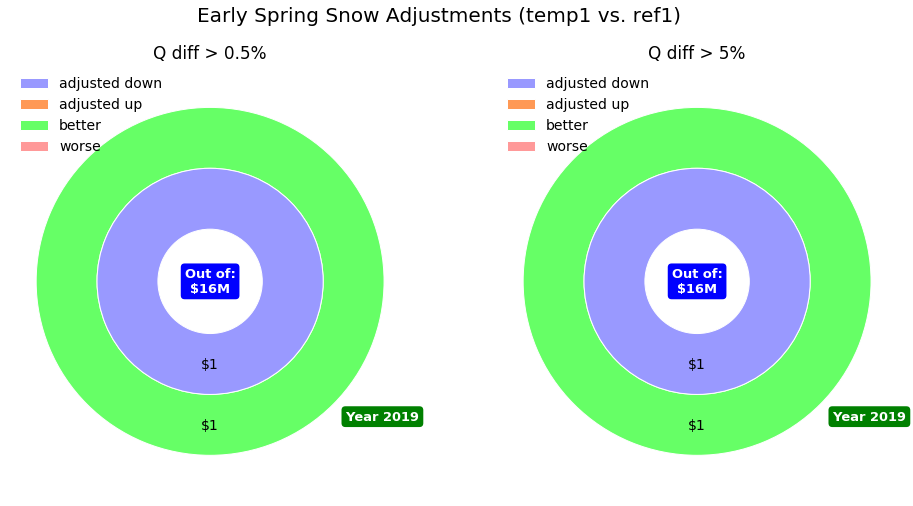

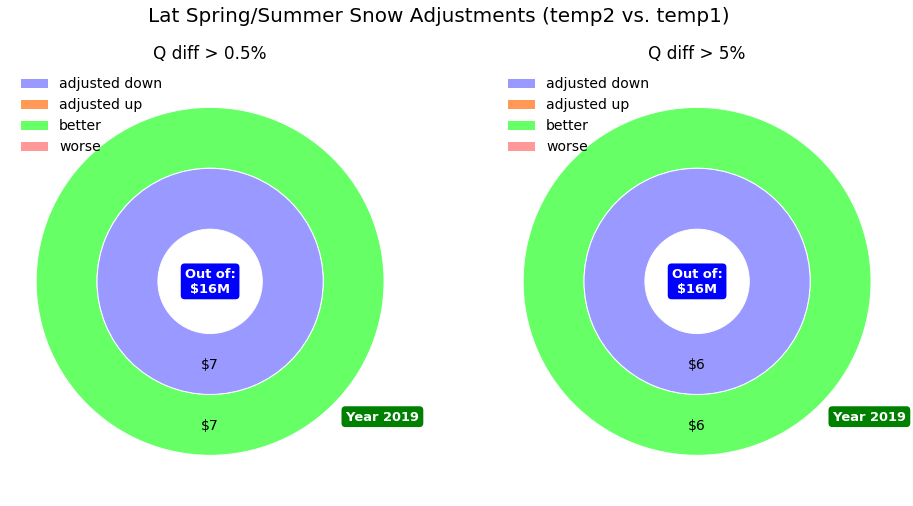

In [ ]:
# Macke pie plot with performance for adjusted models
m.pie_subplot_perf(acc_perf, sheet, 'ref1', 'temp1')
m.pie_subplot_perf(acc_perf, sheet, 'temp1', 'temp2')
#m.pie_subplot_perf(acc_perf_df, ltm, what='snow')


# Performance According to Accumulated Inflow [%] Error and Inflow Profile Correlation (R2) 

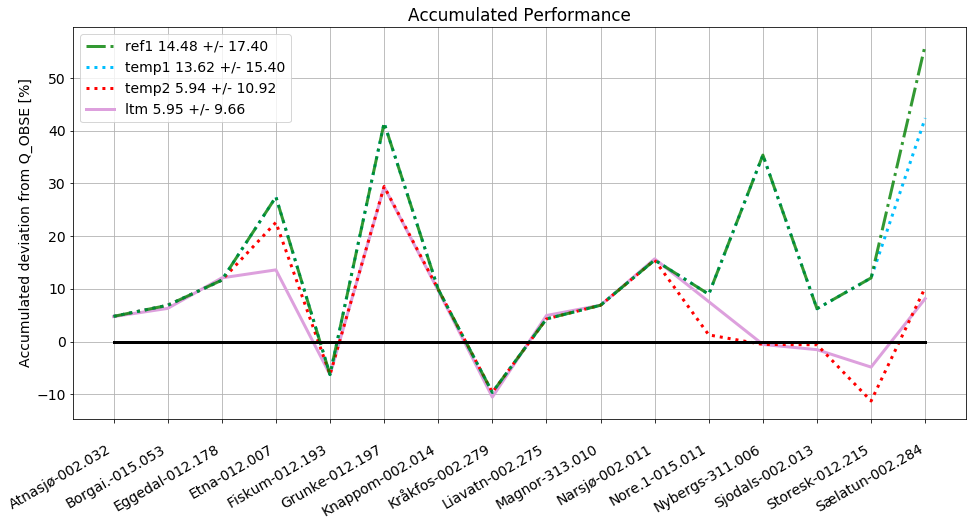

In [ ]:
#plot performance for models in the LTM model
m.plot_perf_models(acc_perf_all, sheet, perfType='Accumulated')


# Induvidual Analysis for Each Model




------------------------------------------------------------------------------------------------------------------------
                                                        Atnasjø-002.032
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-03-26): Peak of snow magasine for ref inndatasett.
WARNING, end after last day! Analysis end (2019-09-22): this script did not find a sufficient estimation of the end of the spring flod, used here date for the ref snow magasine minimum.

Comment from Excel file: "Bittelitt for mye snø, og kanskje litt for lite nedbør inn"



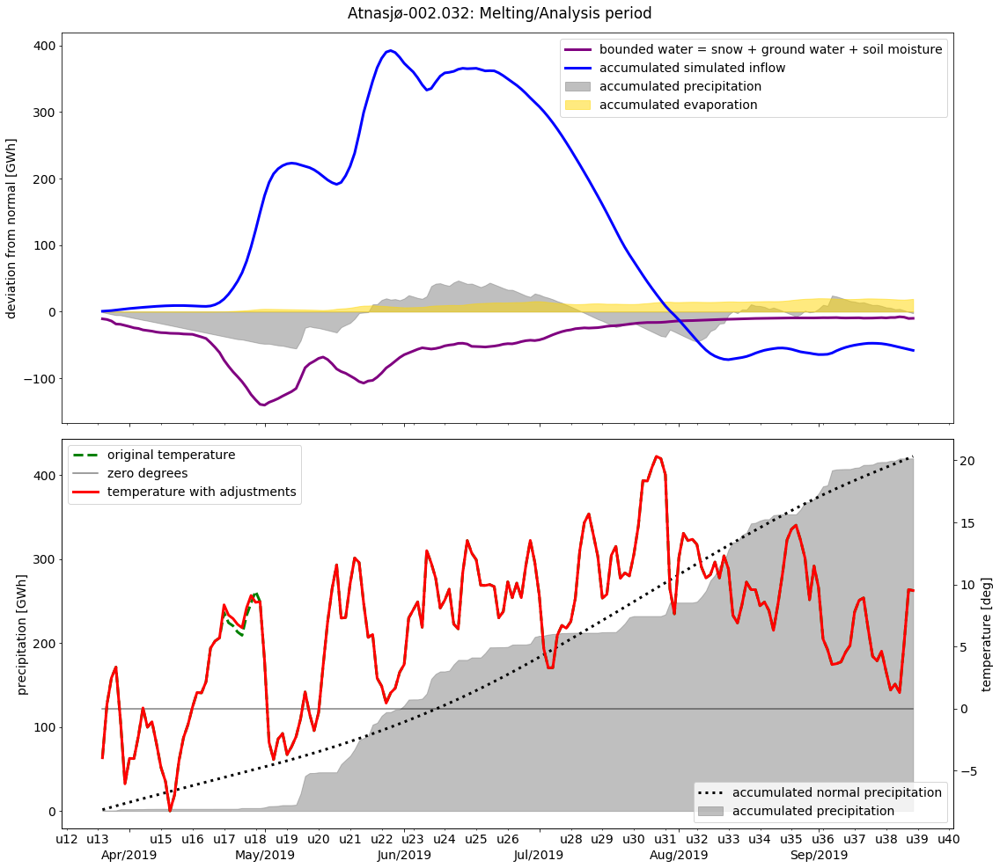

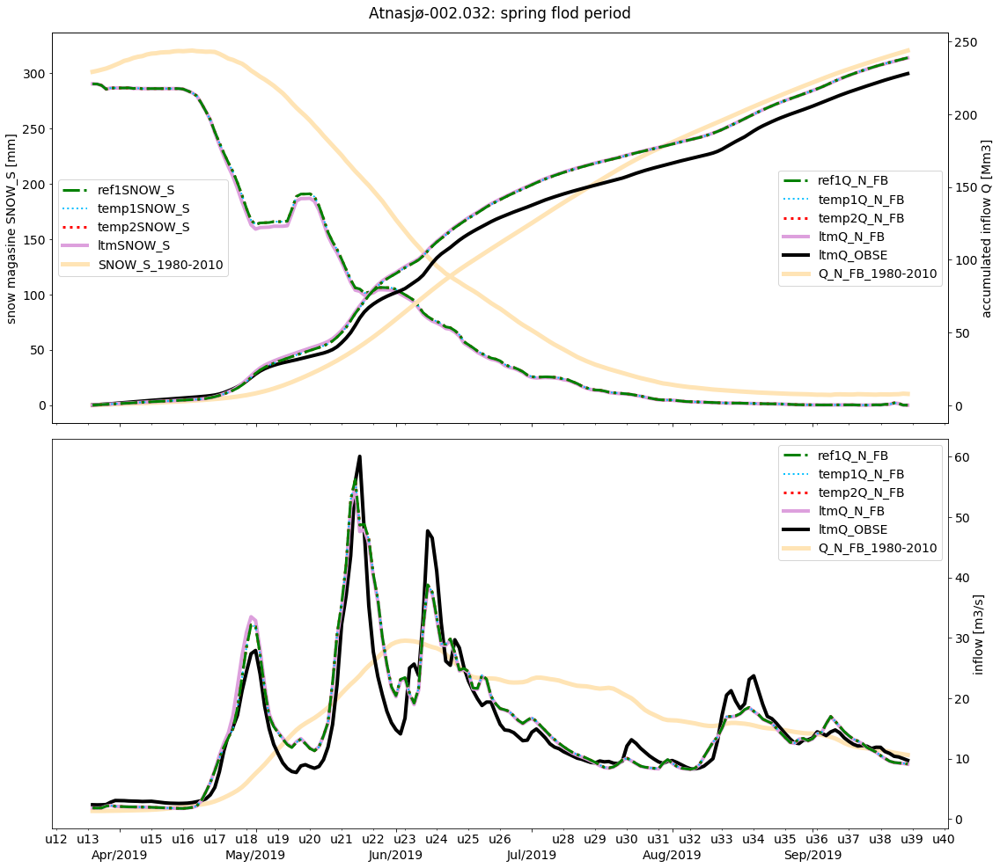


Accumulated performance [percentage deviation]: ref1: 4.78, temp1: 4.78, temp2: 4.78, ltm: 4.74
Profile correlation performance [R2 value]: ]: ref1: 0.88, temp1: 0.88, temp2: 0.88, ltm: 0.88




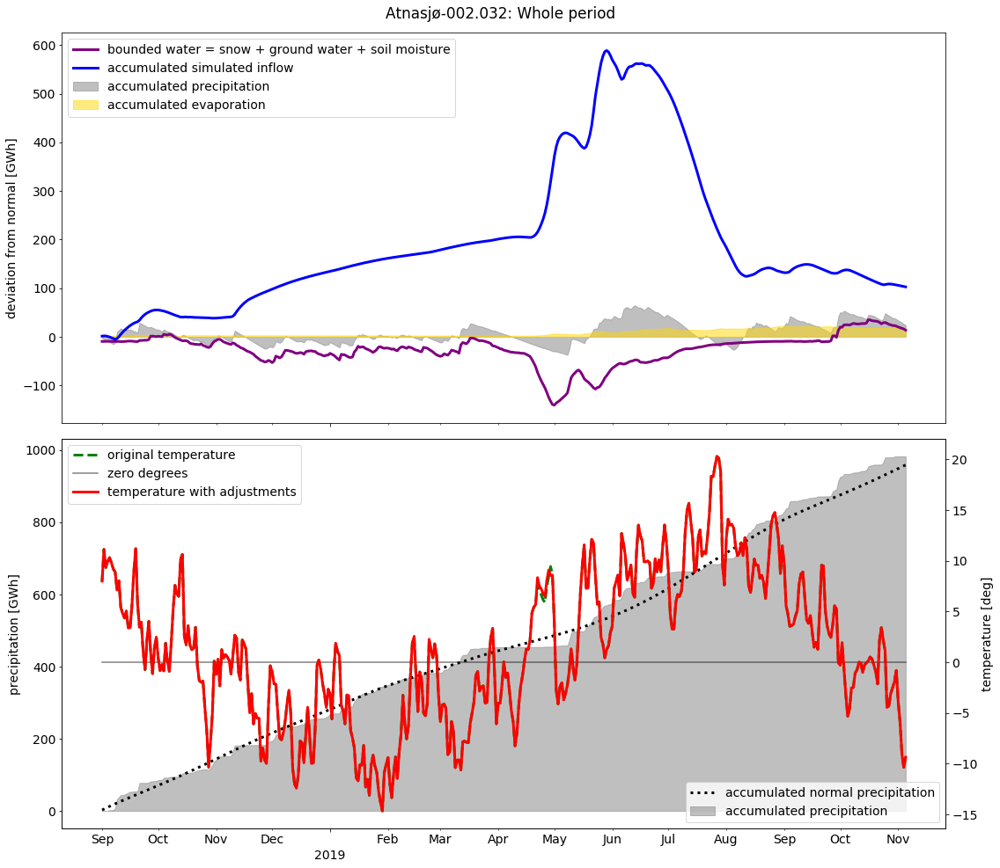

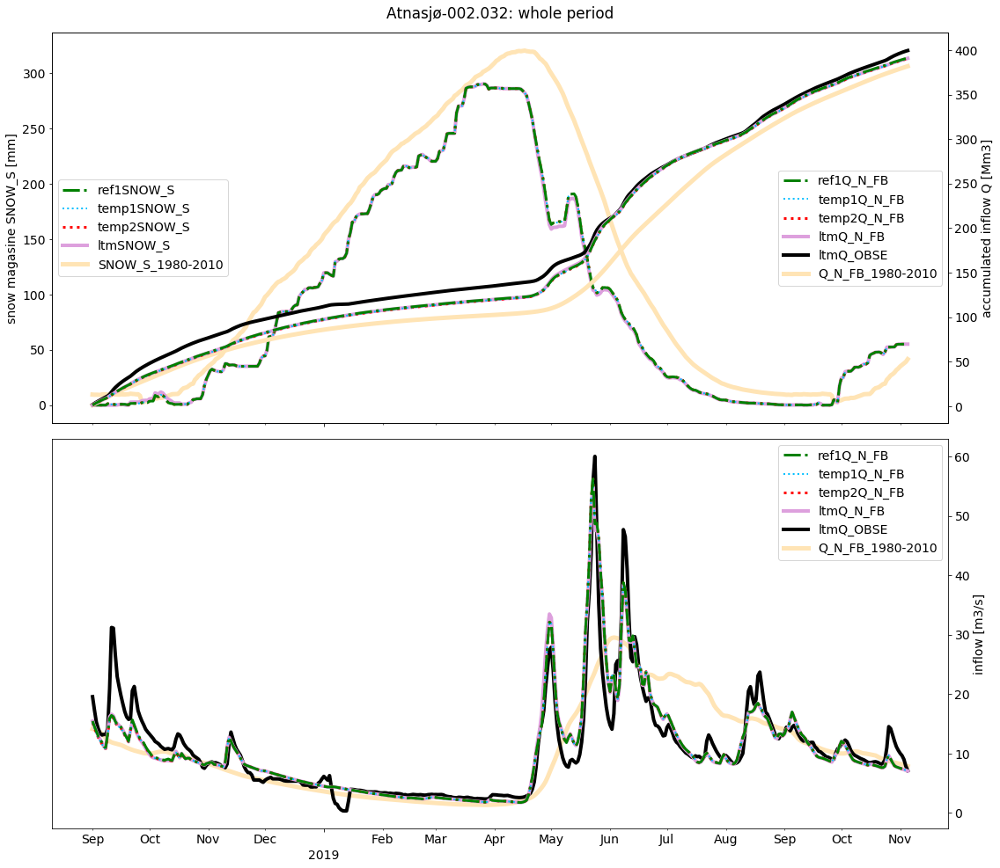








------------------------------------------------------------------------------------------------------------------------
                                                        Borgai.-015.053
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-03-26): Peak of snow magasine for ref inndatasett.
WARNING! Analysis end (2019-05-22): this script did not find a sufficient estimation of the end of the spring flod, used here date for the ref snow magasine minimum.


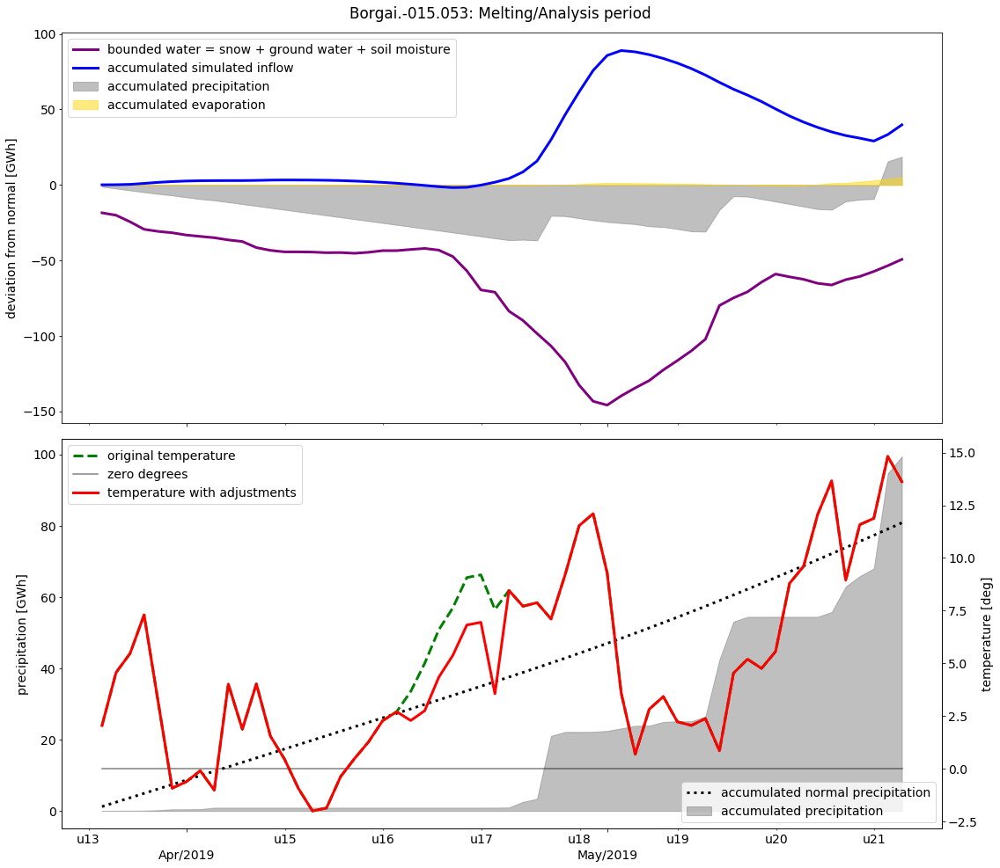

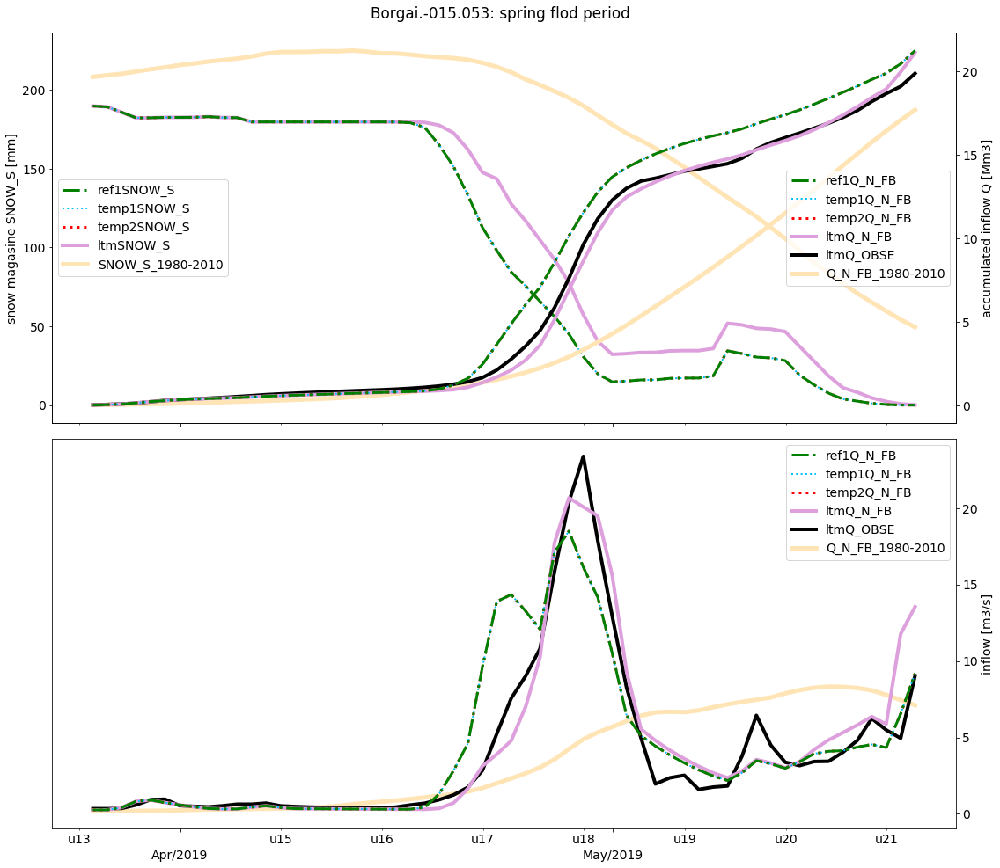


Accumulated performance [percentage deviation]: ref1: 6.88, temp1: 6.88, temp2: 6.88, ltm: 6.29
Profile correlation performance [R2 value]: ]: ref1: 0.80, temp1: 0.80, temp2: 0.80, ltm: 0.91




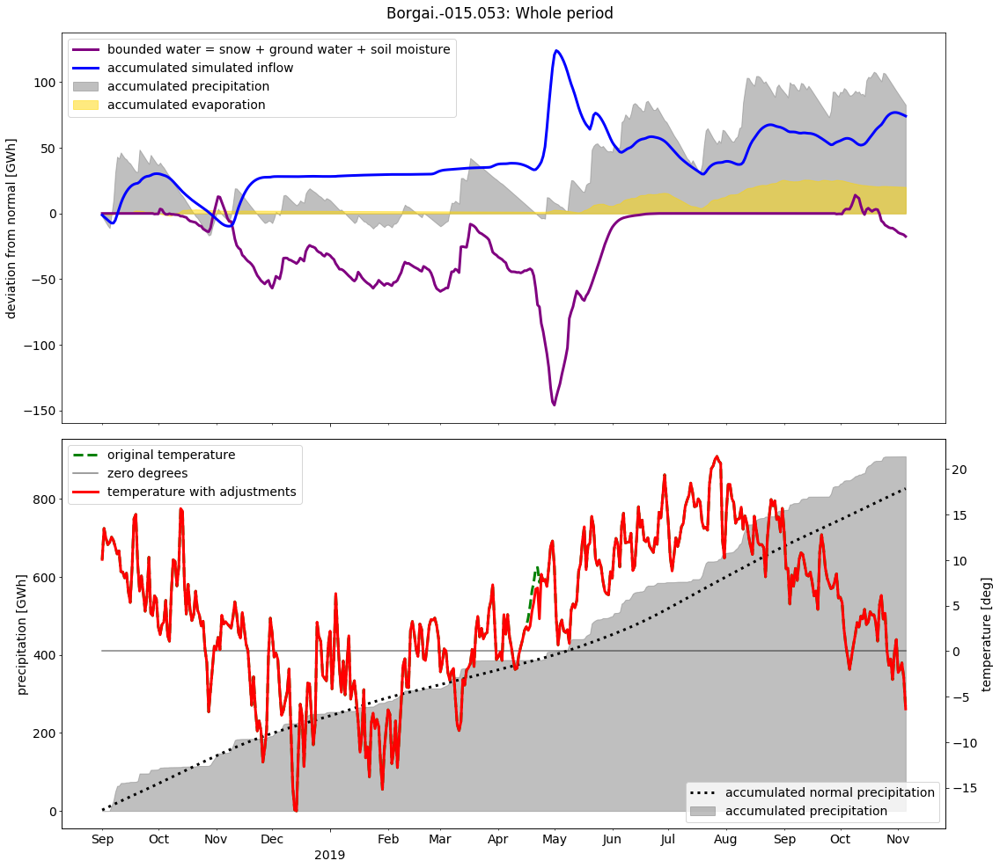

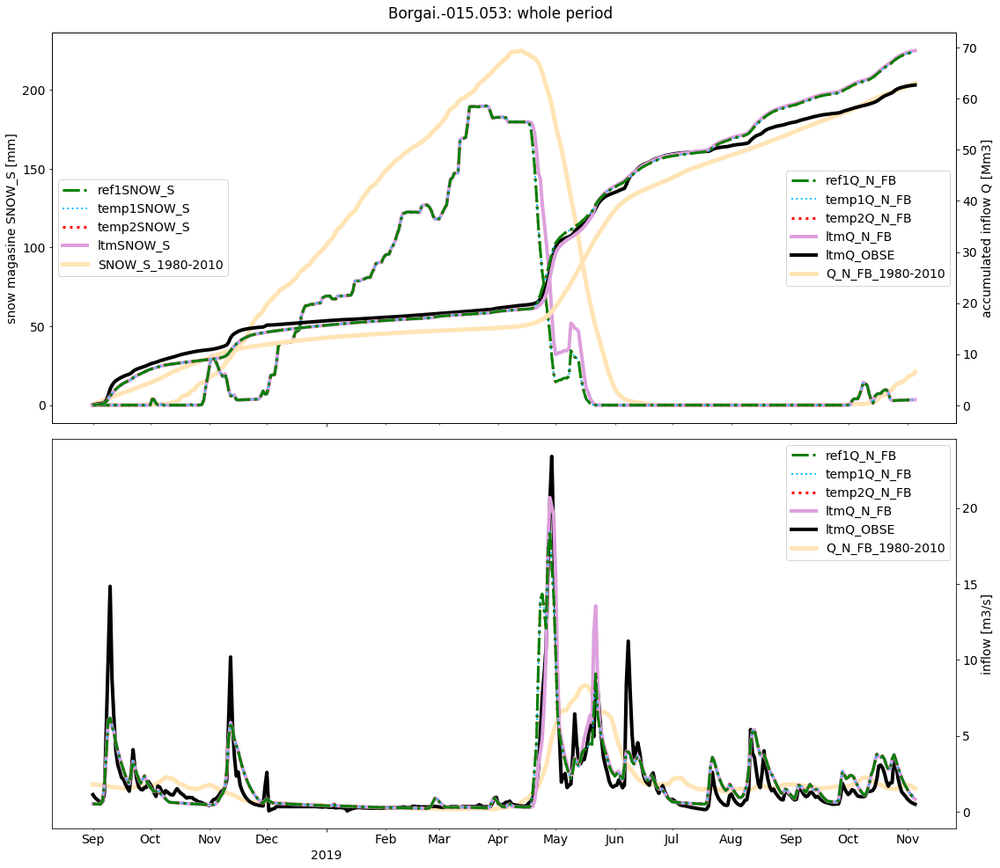








------------------------------------------------------------------------------------------------------------------------
                                                        Eggedal-012.178
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-03-19): Peak of snow magasine for ref inndatasett.
WARNING, end after last day! Analysis end (2019-09-21): this script did not find a sufficient estimation of the end of the spring flod, used here date for the ref snow magasine minimum.

Comment from Excel file: "Kunne ha smelta ut snø rundt 1.4 i stedenfor å bremse smeltingen i slutten av april"



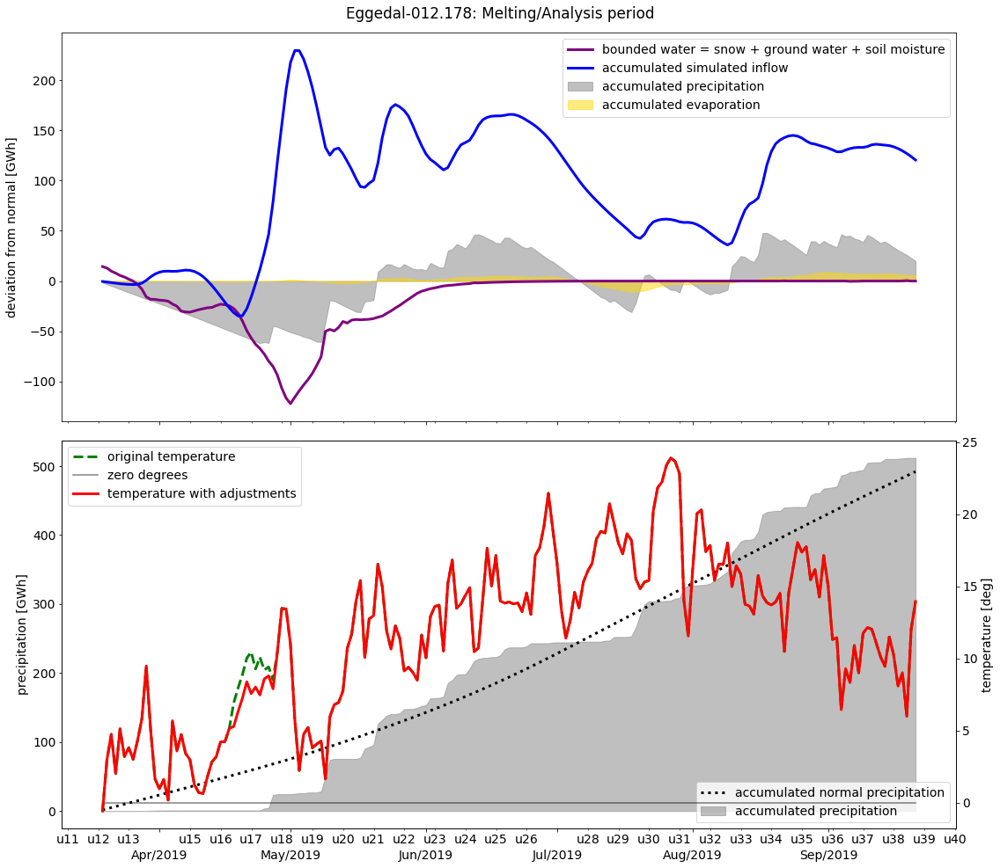

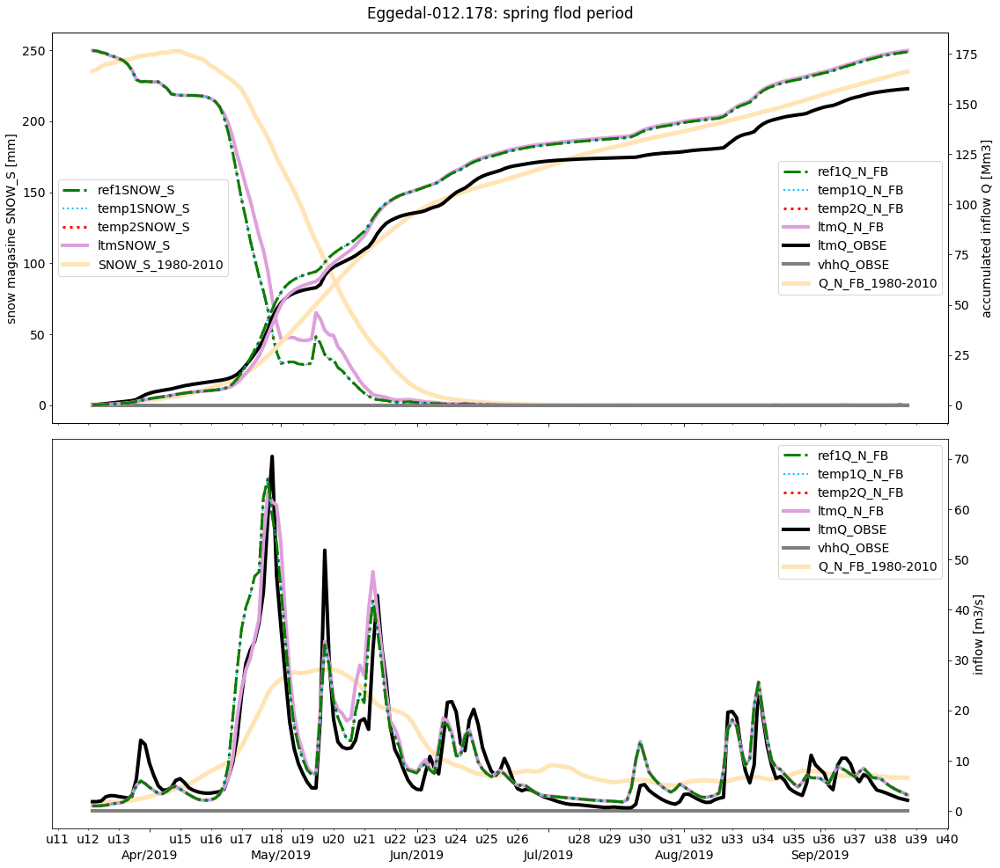


Accumulated performance [percentage deviation]: ref1: 11.64, temp1: 11.64, temp2: 11.64, ltm: 12.08
Profile correlation performance [R2 value]: ]: ref1: 0.83, temp1: 0.83, temp2: 0.83, ltm: 0.83




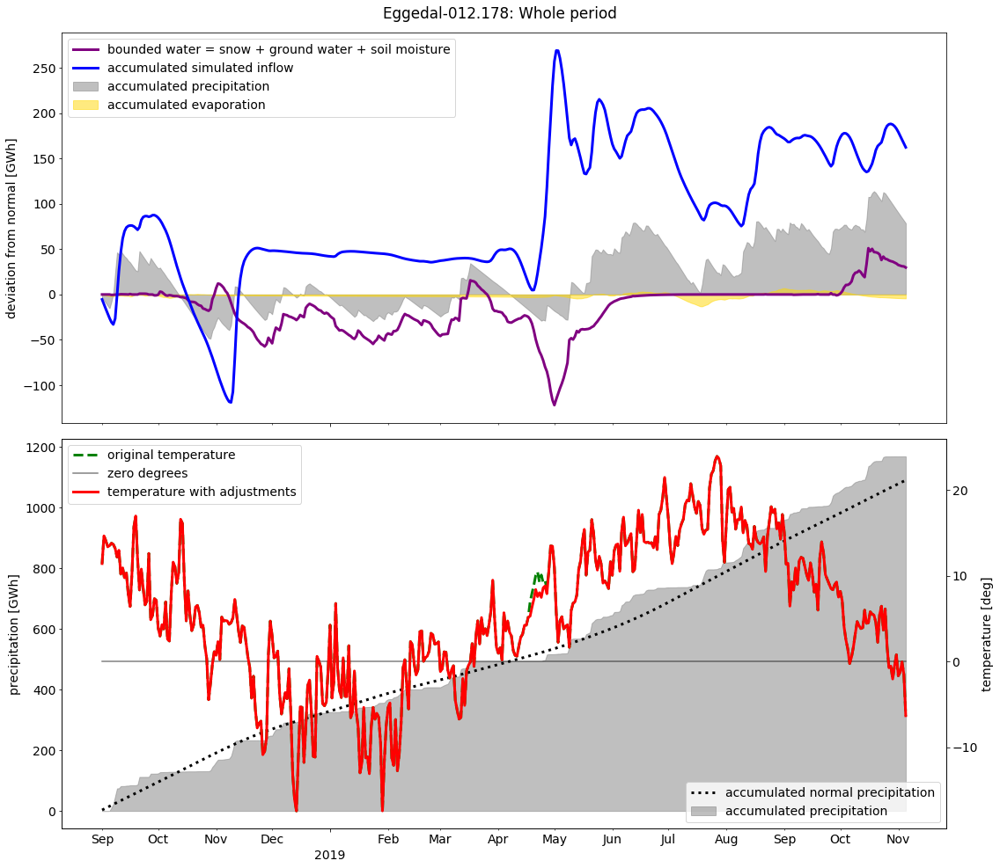

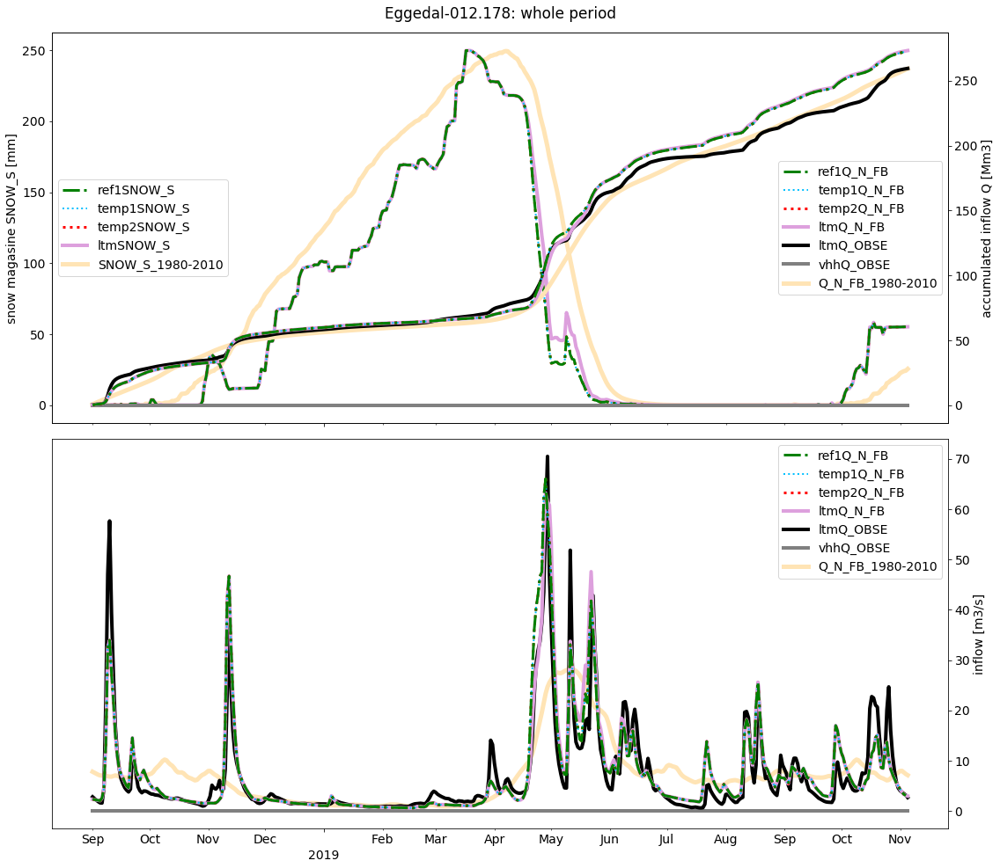








------------------------------------------------------------------------------------------------------------------------
                                                        Etna-012.007
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-03-23): Peak of snow magasine for ref inndatasett.
WARNING! Analysis end (2019-06-19): this script did not find a sufficient estimation of the end of the spring flod, used here date for the ref snow magasine minimum.

Comment from Excel file: "Her var det for mye snø (snølegging?) eller nedbør gjennom vinteren"



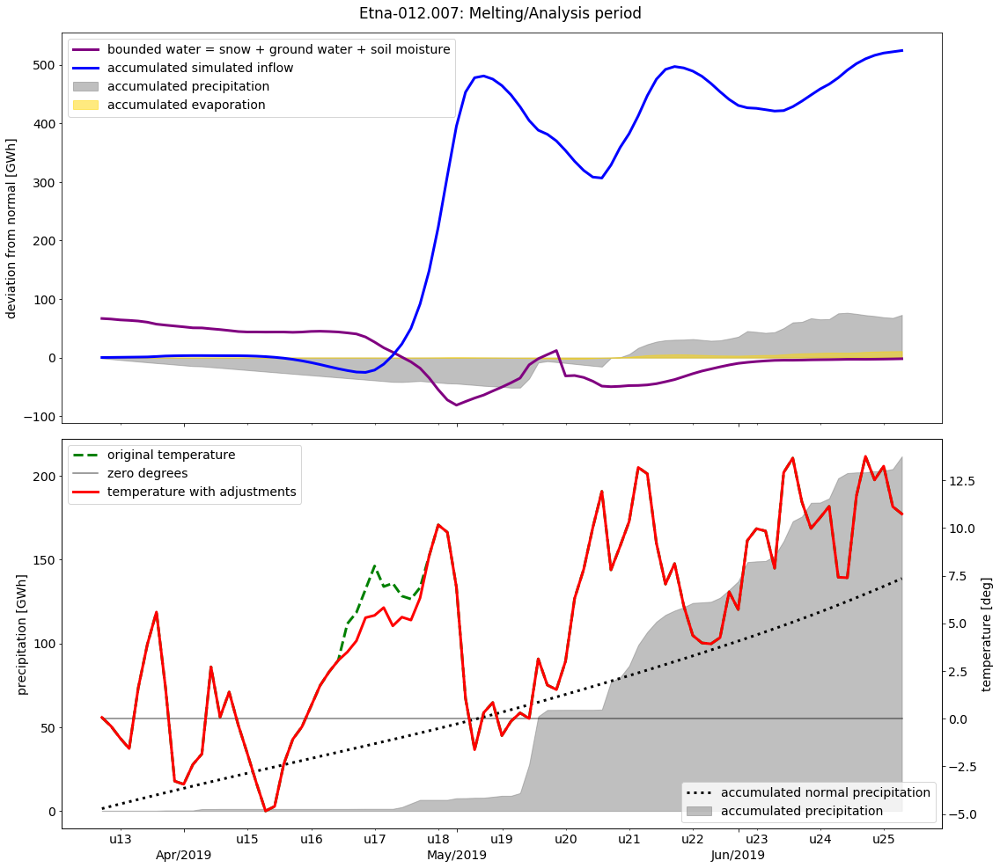

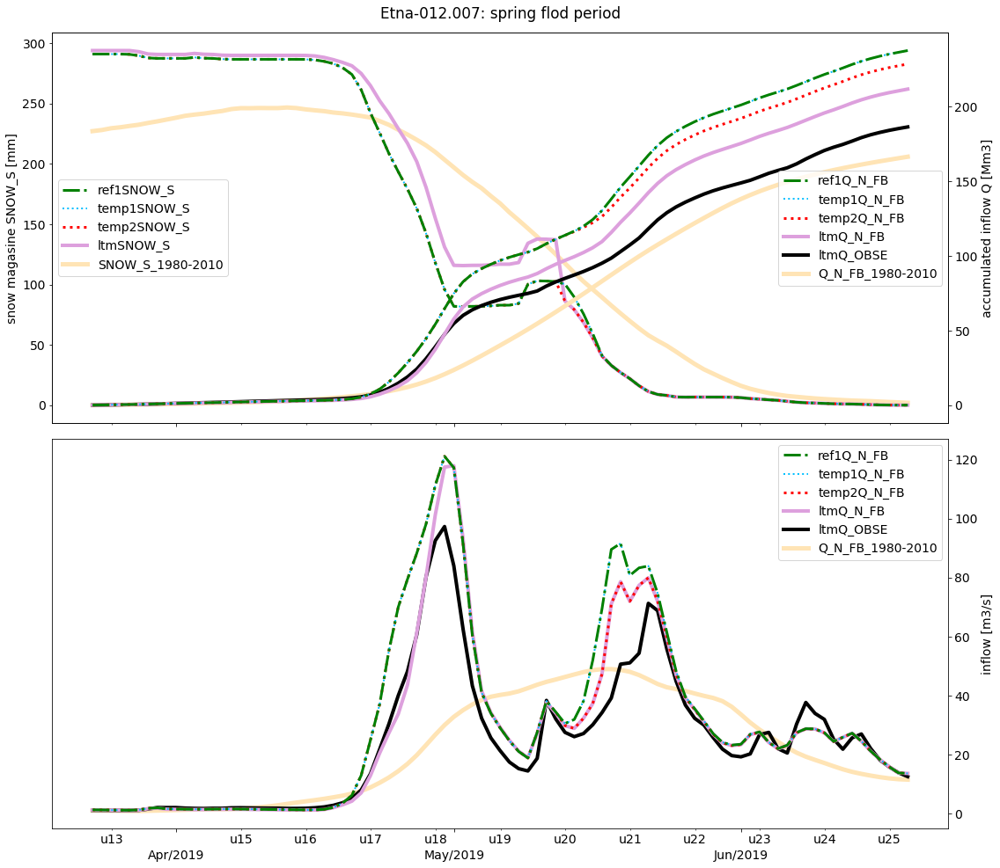


Accumulated performance [percentage deviation]: ref1: 27.44, temp1: 27.44, temp2: 22.60, ltm: 13.60
Profile correlation performance [R2 value]: ]: ref1: 0.65, temp1: 0.65, temp2: 0.76, ltm: 0.85




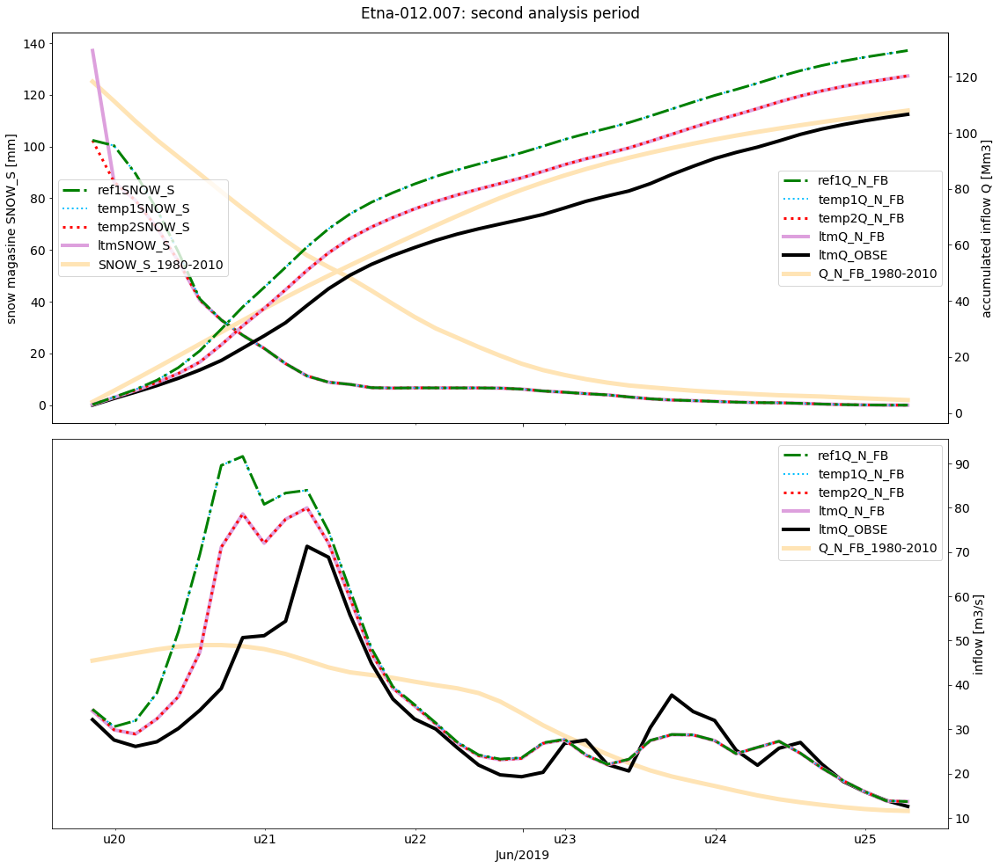

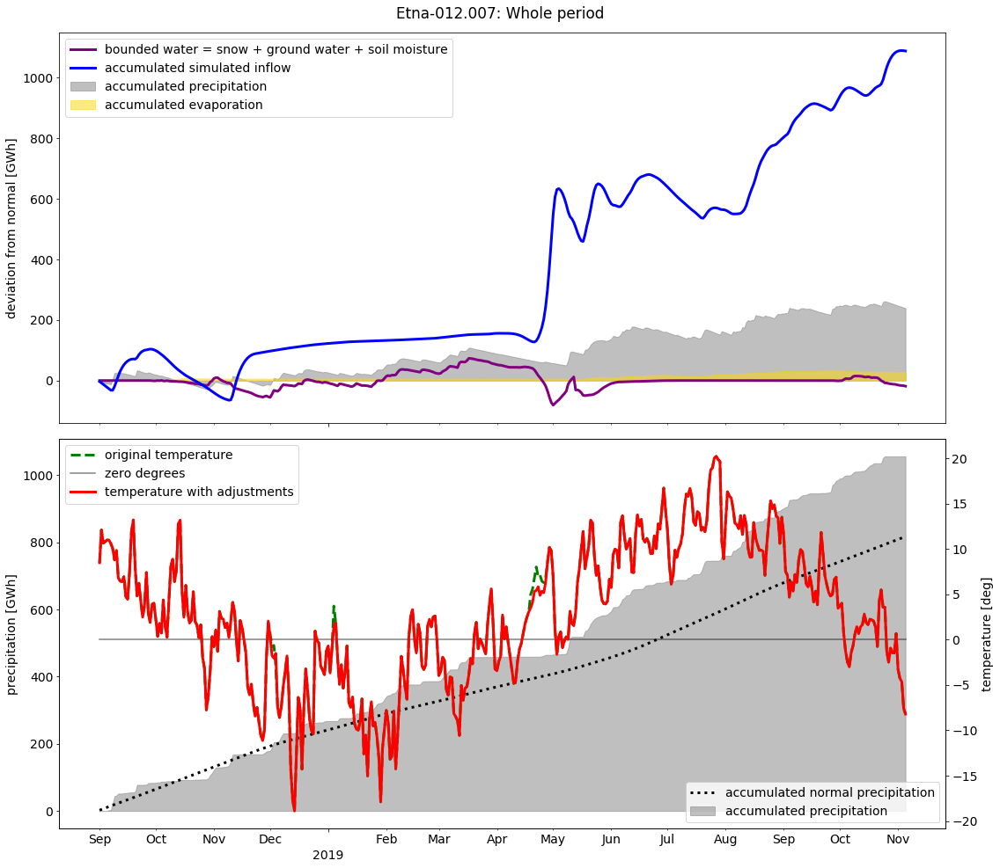

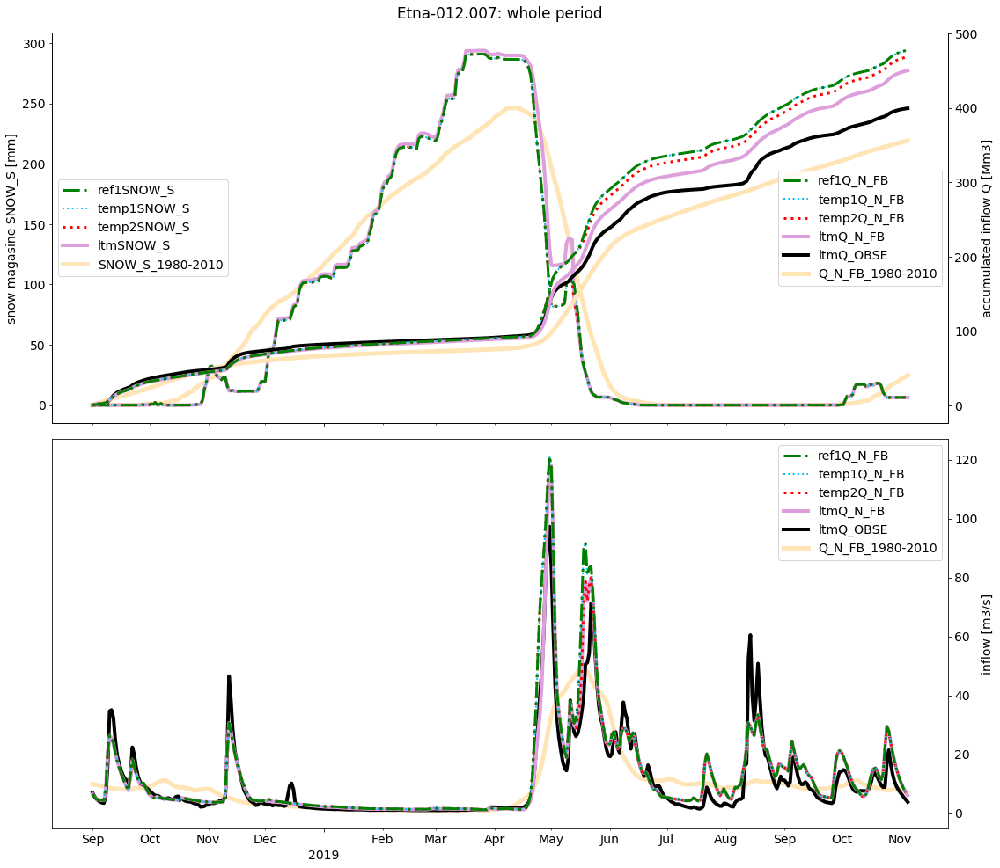








------------------------------------------------------------------------------------------------------------------------
                                                        Fiskum-012.193
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-03-17): Peak of snow magasine for ref inndatasett.
Analysis end (2019-05-03): First day when the inflow models are close to Q_OBSE, one week after the snow magasine goes under 20 GWh SWE.


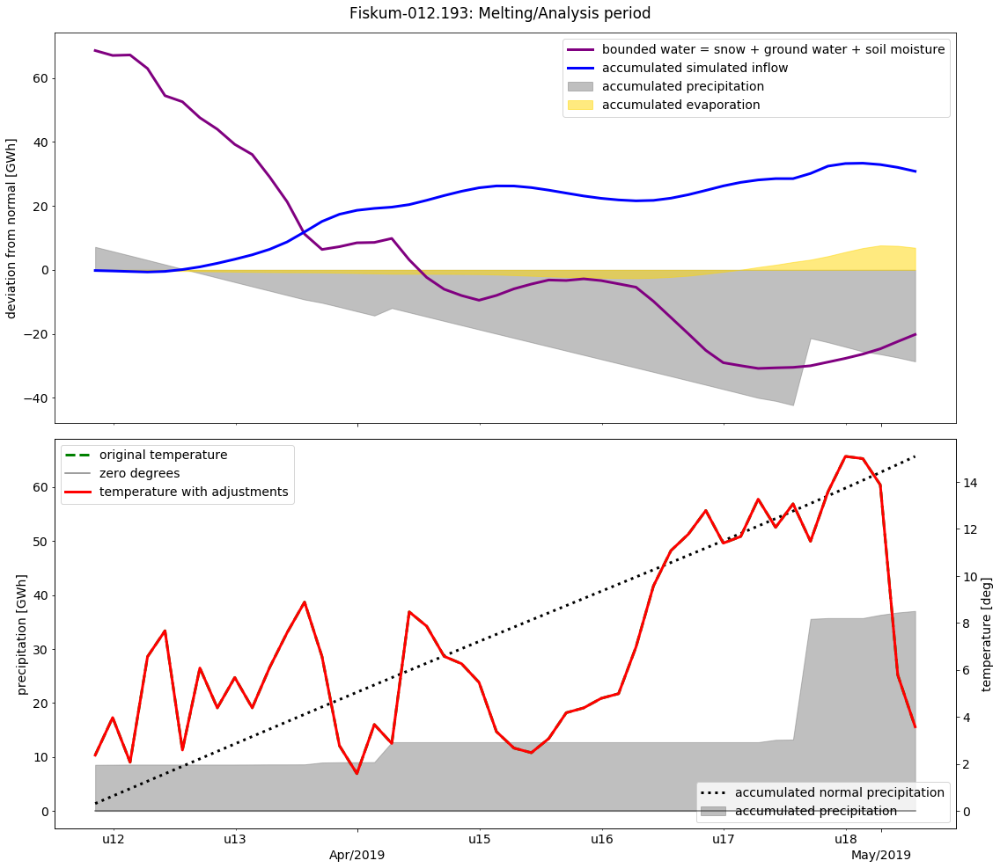

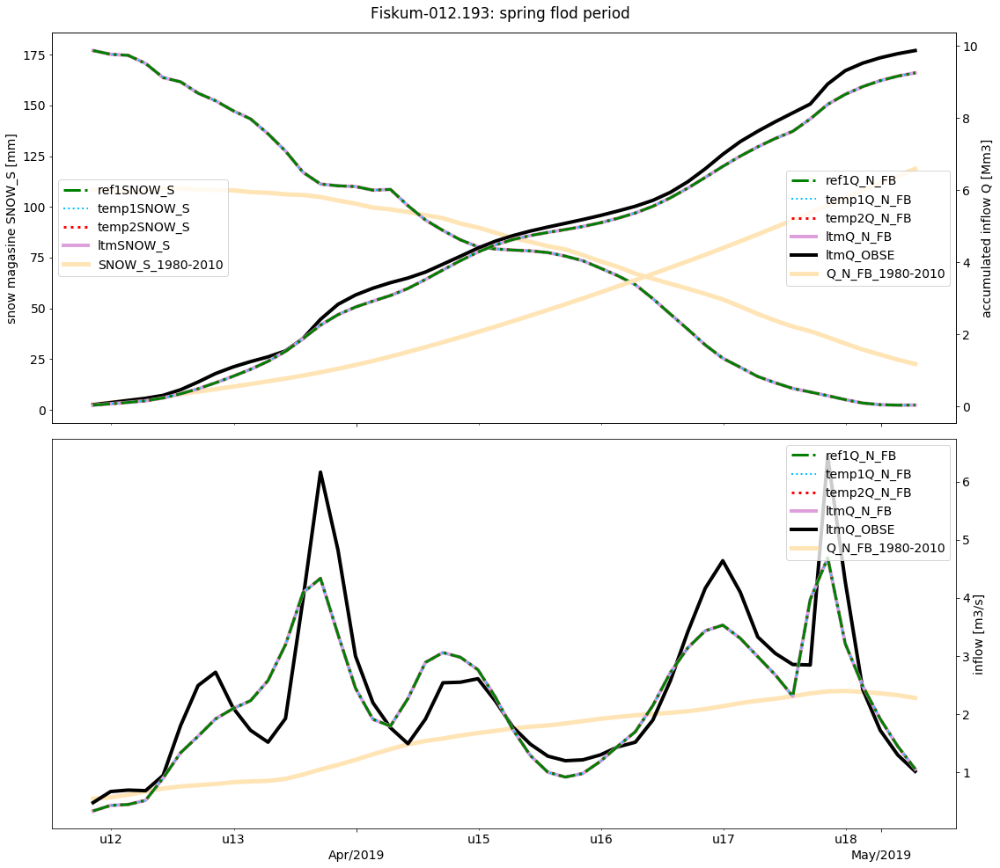


Accumulated performance [percentage deviation]: ref1: -6.27, temp1: -6.27, temp2: -6.27, ltm: -6.27
Profile correlation performance [R2 value]: ]: ref1: 0.75, temp1: 0.75, temp2: 0.75, ltm: 0.75




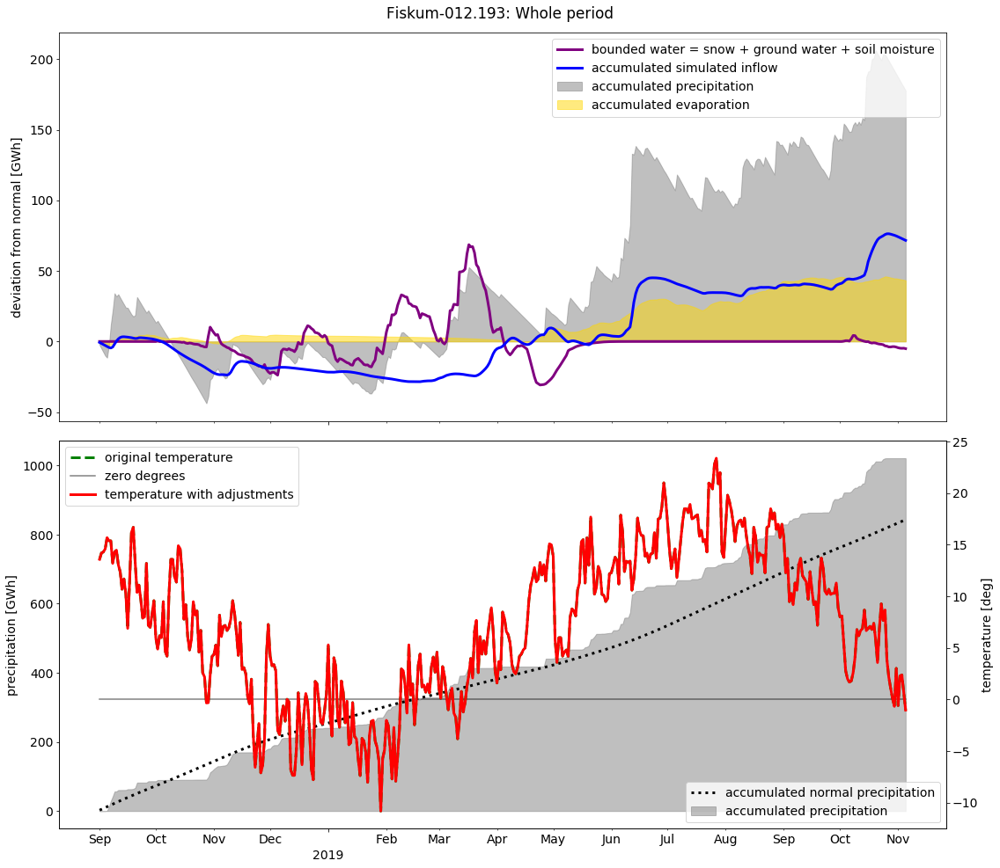

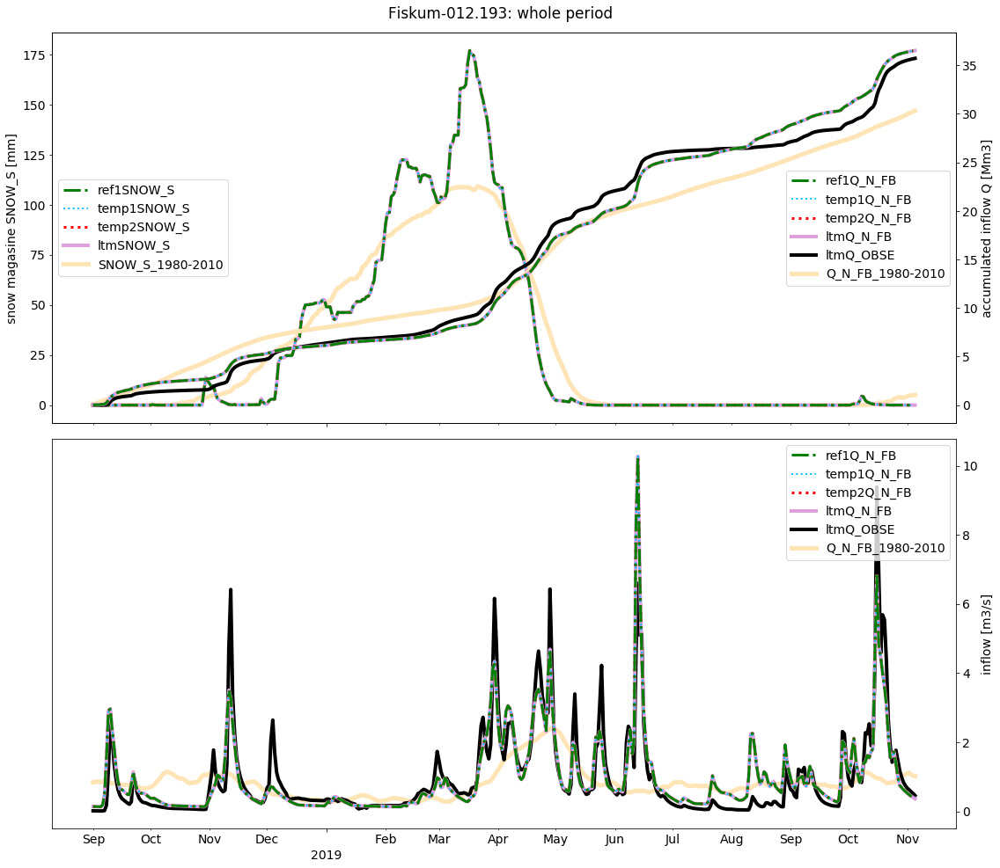








------------------------------------------------------------------------------------------------------------------------
                                                        Grunke-012.197
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-03-24): Peak of snow magasine for ref inndatasett.
WARNING, end after last day! Analysis end (2019-09-22): this script did not find a sufficient estimation of the end of the spring flod, used here date for the ref snow magasine minimum.

Comment from Excel file: "Her "



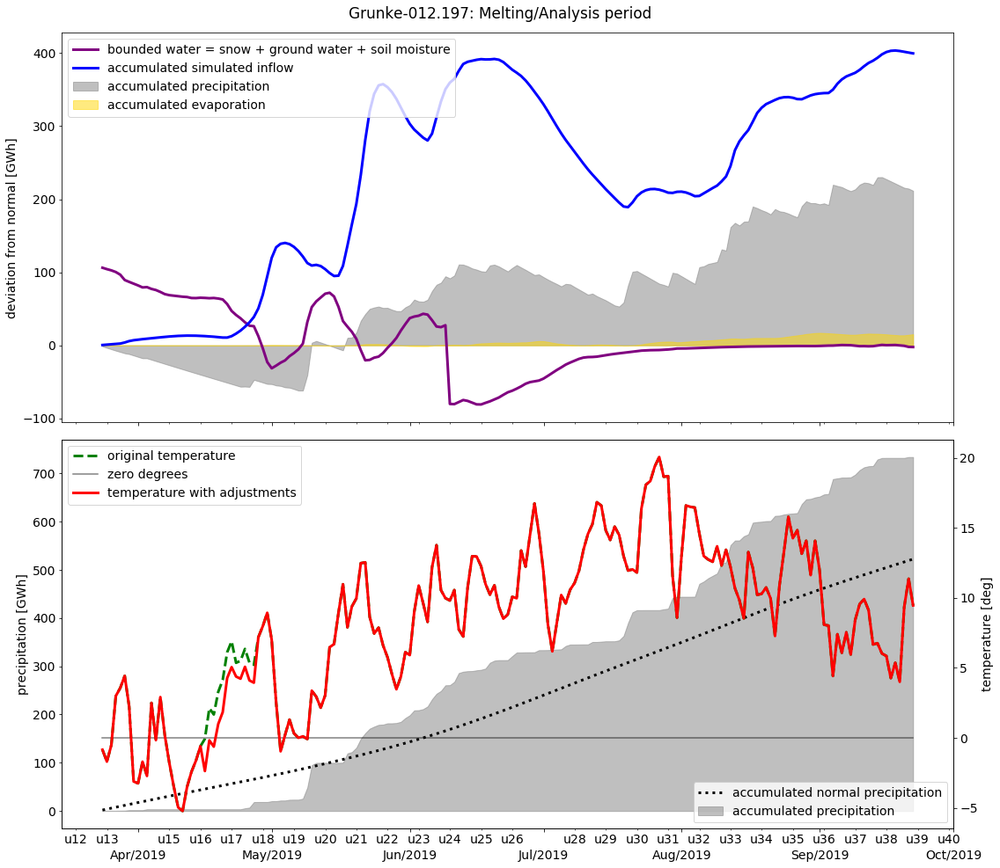

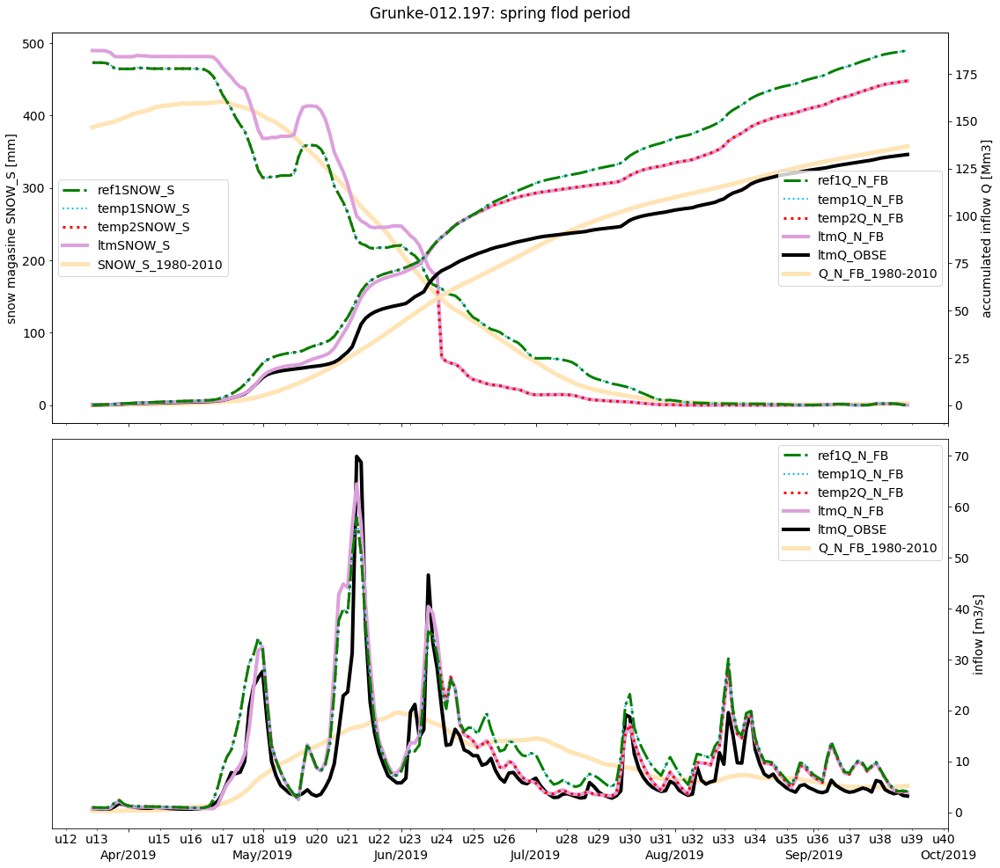


Accumulated performance [percentage deviation]: ref1: 41.46, temp1: 41.46, temp2: 29.42, ltm: 29.33
Profile correlation performance [R2 value]: ]: ref1: 0.67, temp1: 0.67, temp2: 0.73, ltm: 0.72




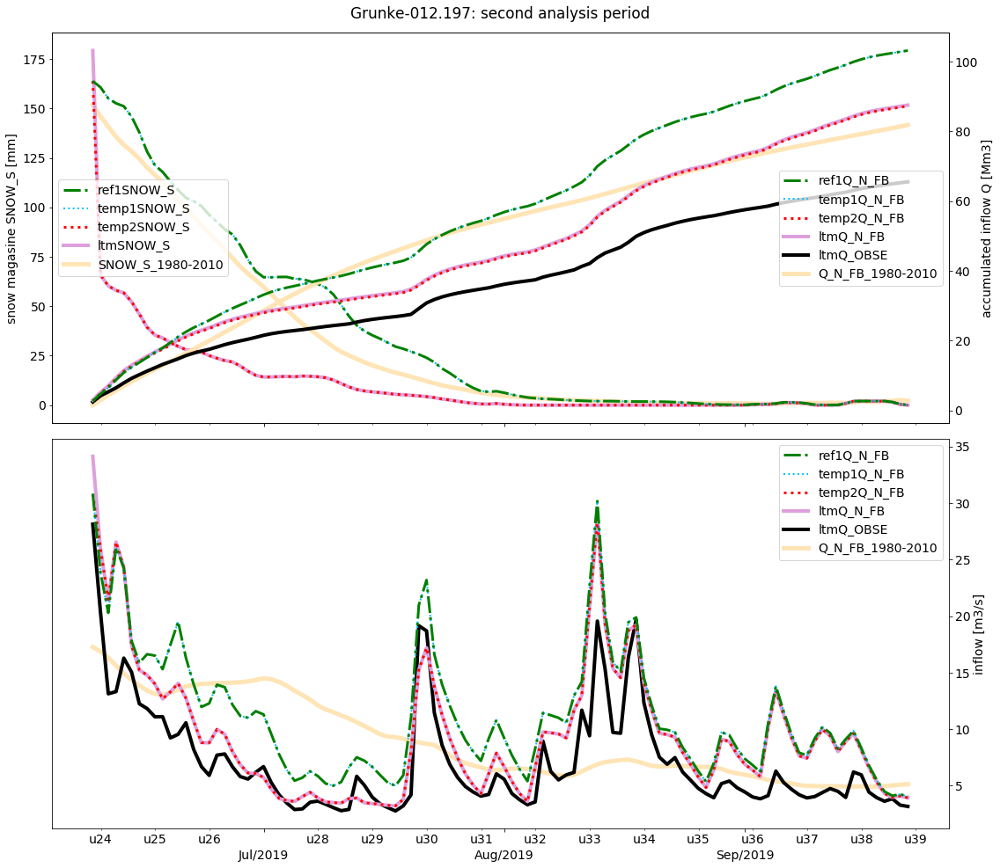

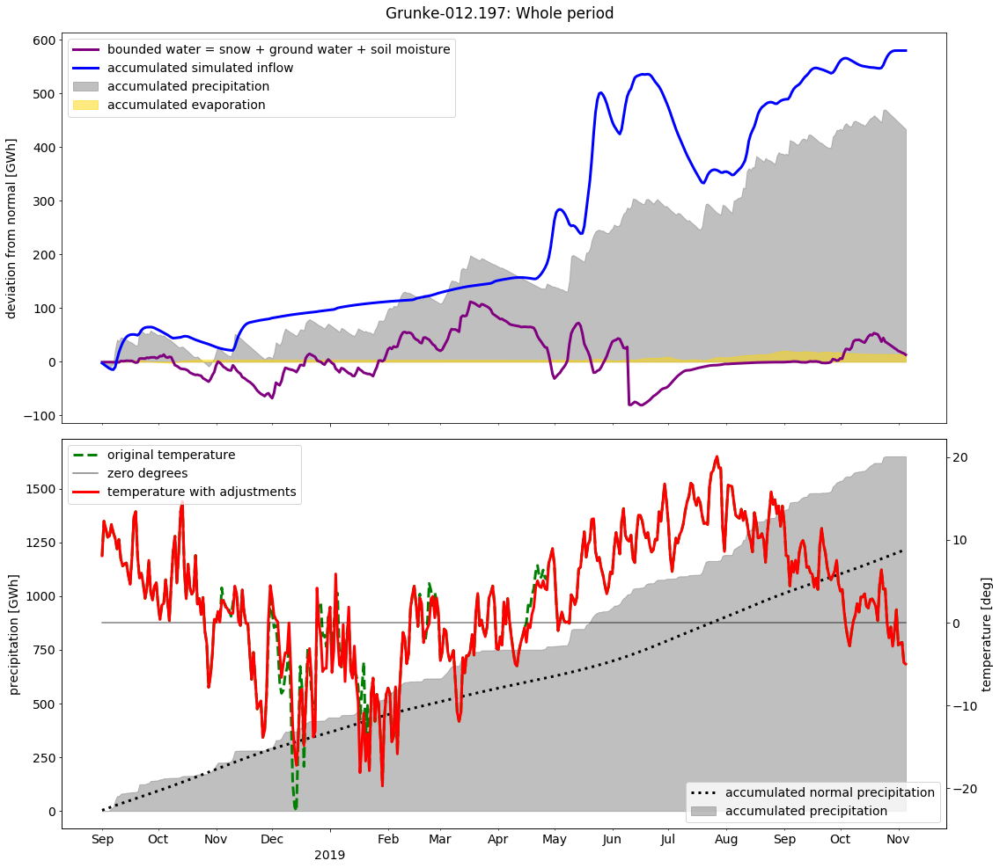

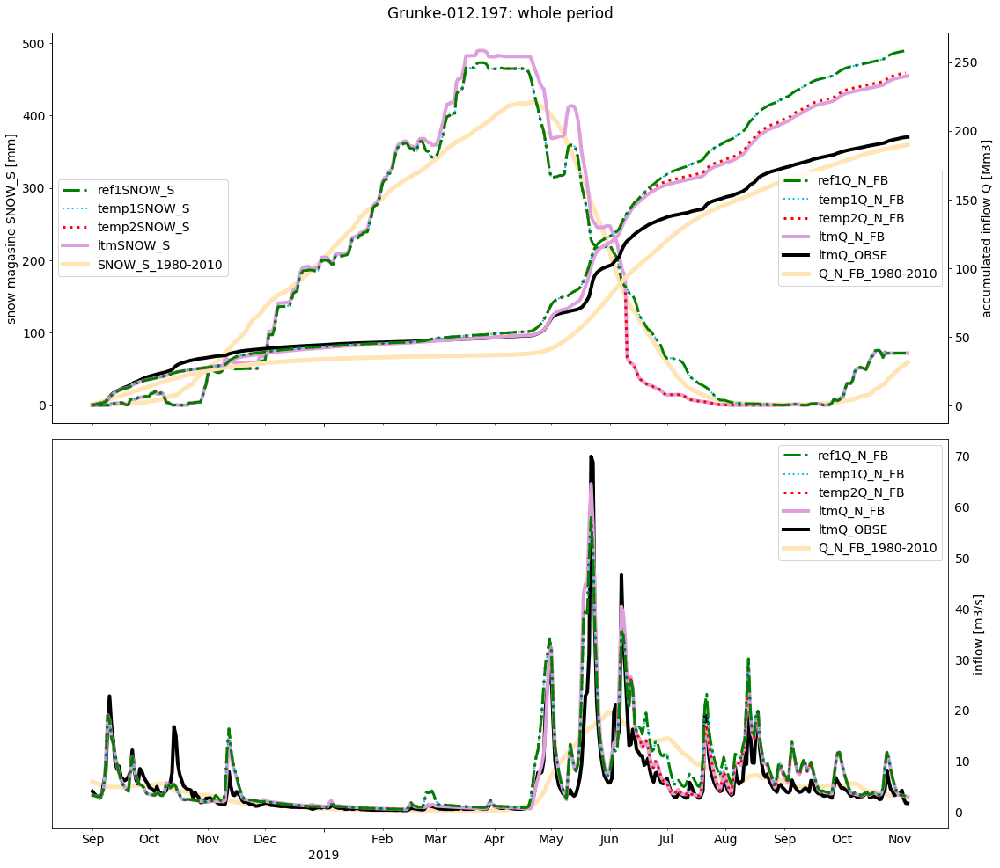








------------------------------------------------------------------------------------------------------------------------
                                                        Knappom-002.014
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-03-19): Peak of snow magasine for ref inndatasett.
Analysis end (2019-05-15): First day when the inflow models are close to Q_OBSE, one week after the snow magasine goes under 20 GWh SWE.


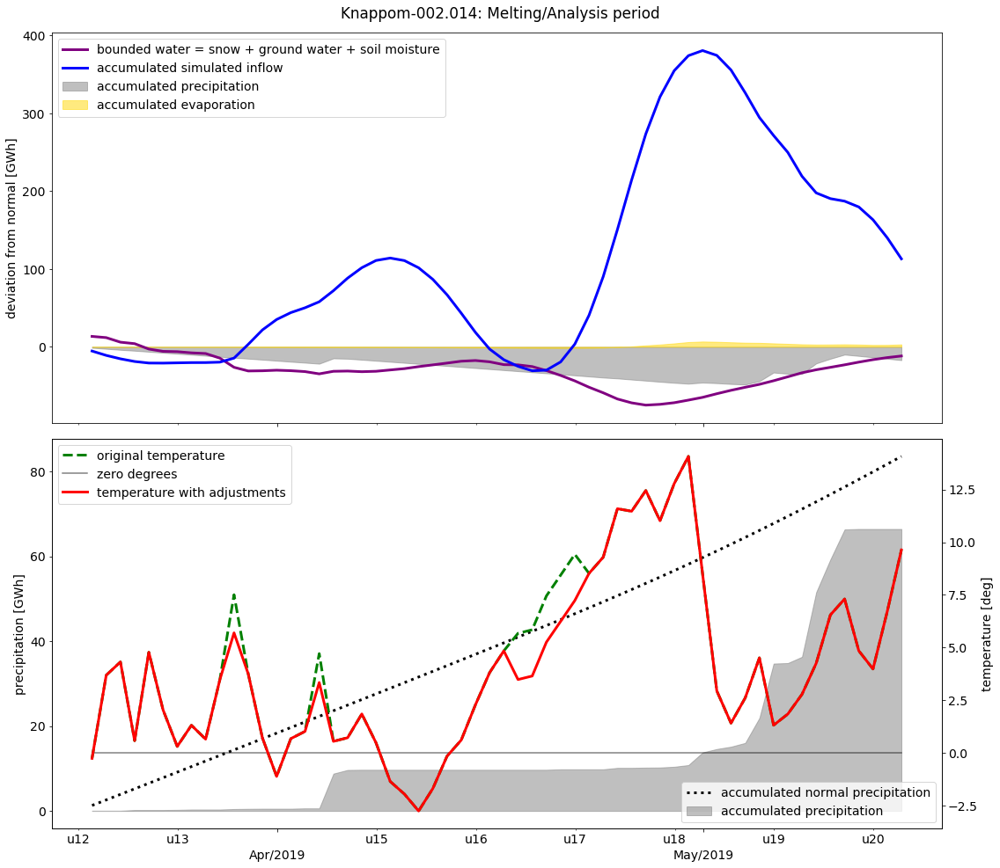

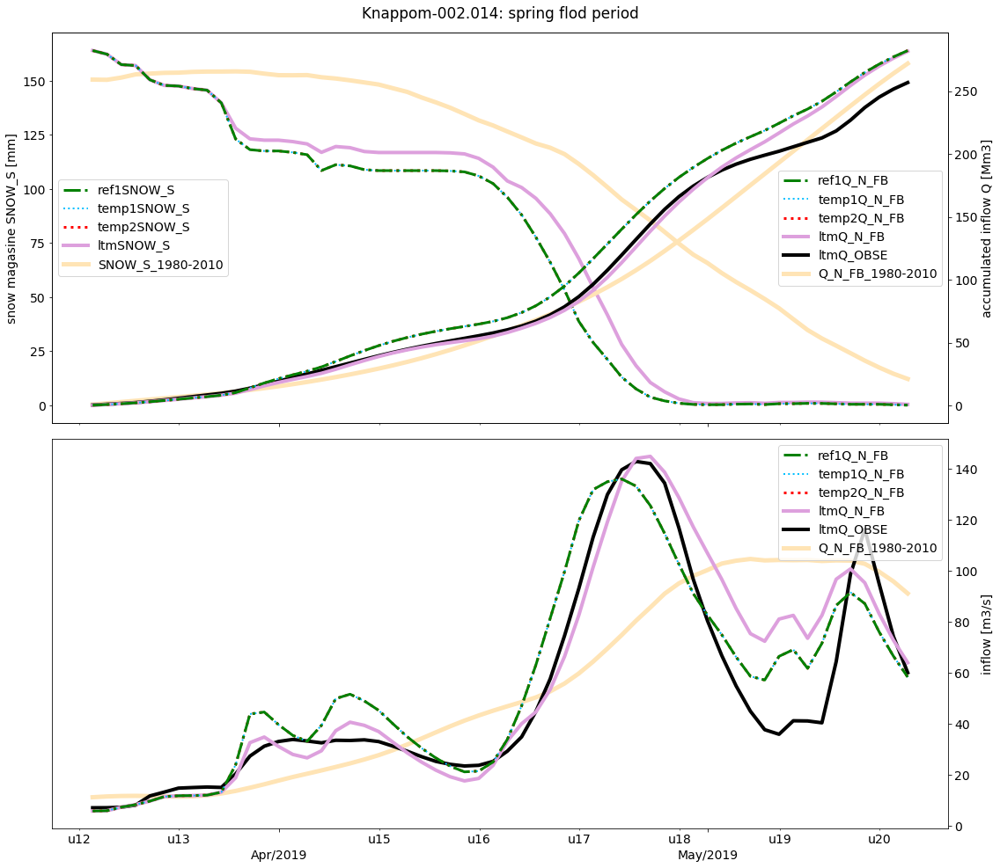


Accumulated performance [percentage deviation]: ref1: 9.90, temp1: 9.90, temp2: 9.90, ltm: 9.69
Profile correlation performance [R2 value]: ]: ref1: 0.87, temp1: 0.87, temp2: 0.87, ltm: 0.84




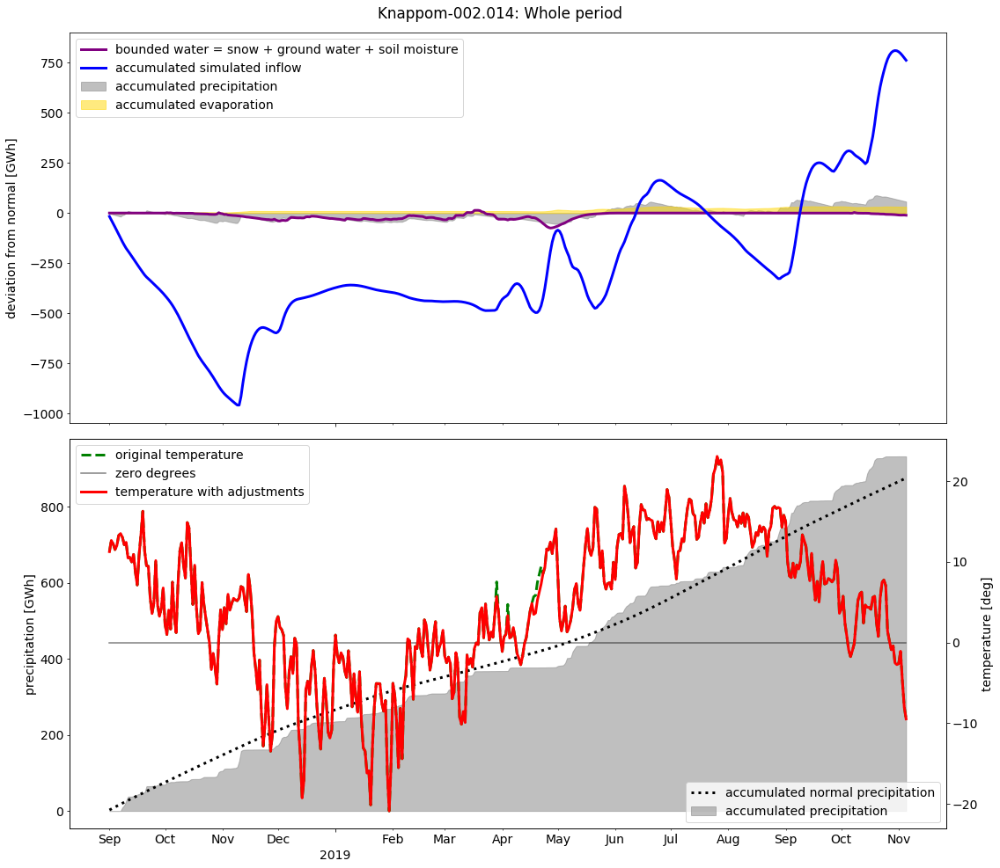

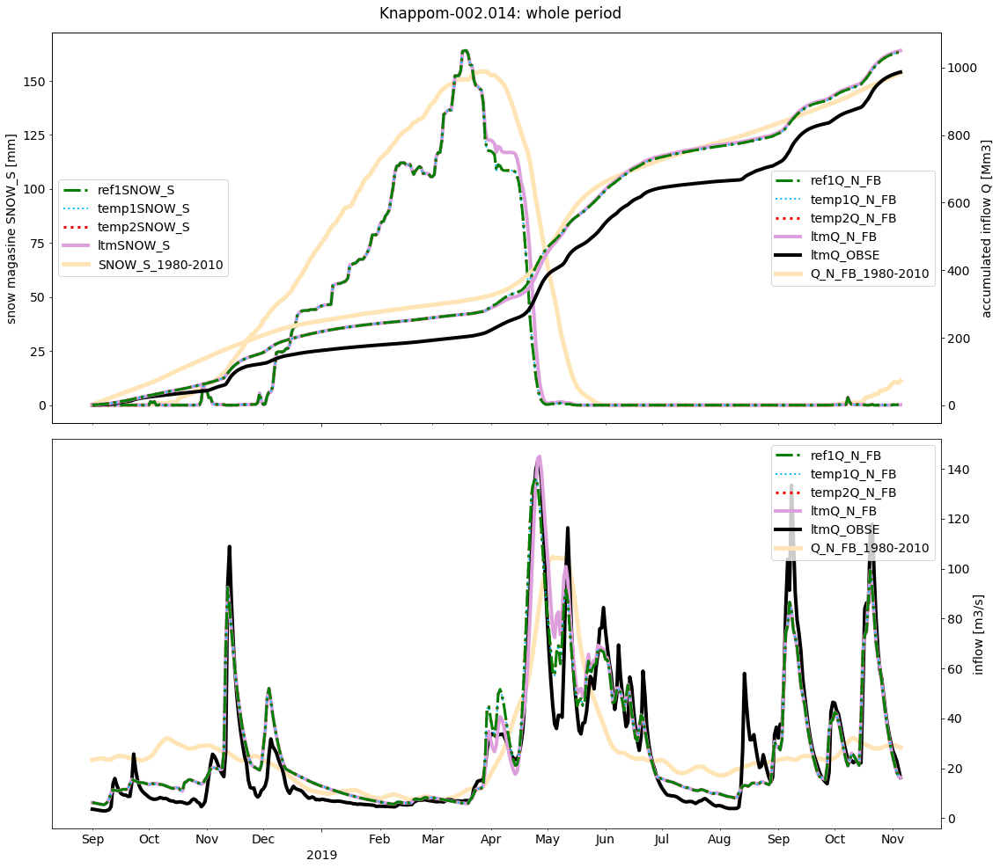








------------------------------------------------------------------------------------------------------------------------
                                                        Kråkfos-002.279
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-03-18): Peak of snow magasine for ref inndatasett.
Analysis end (2019-05-09): First day when the inflow models are close to Q_OBSE, one week after the snow magasine goes under 20 GWh SWE.


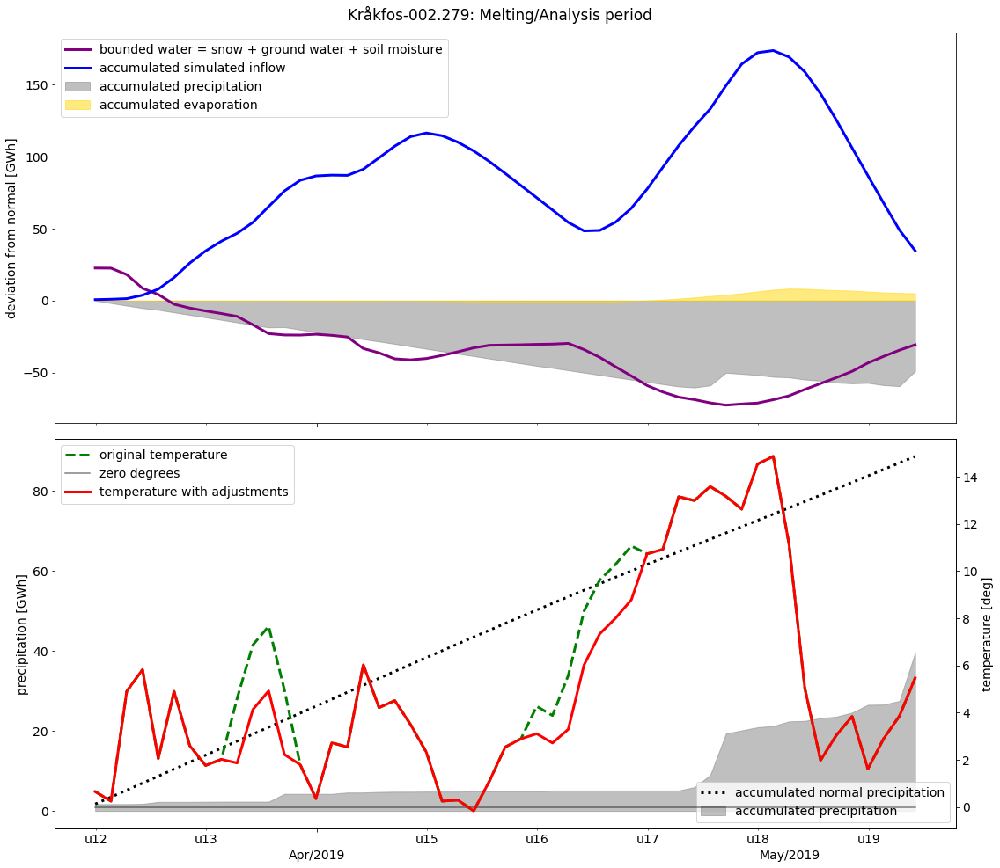

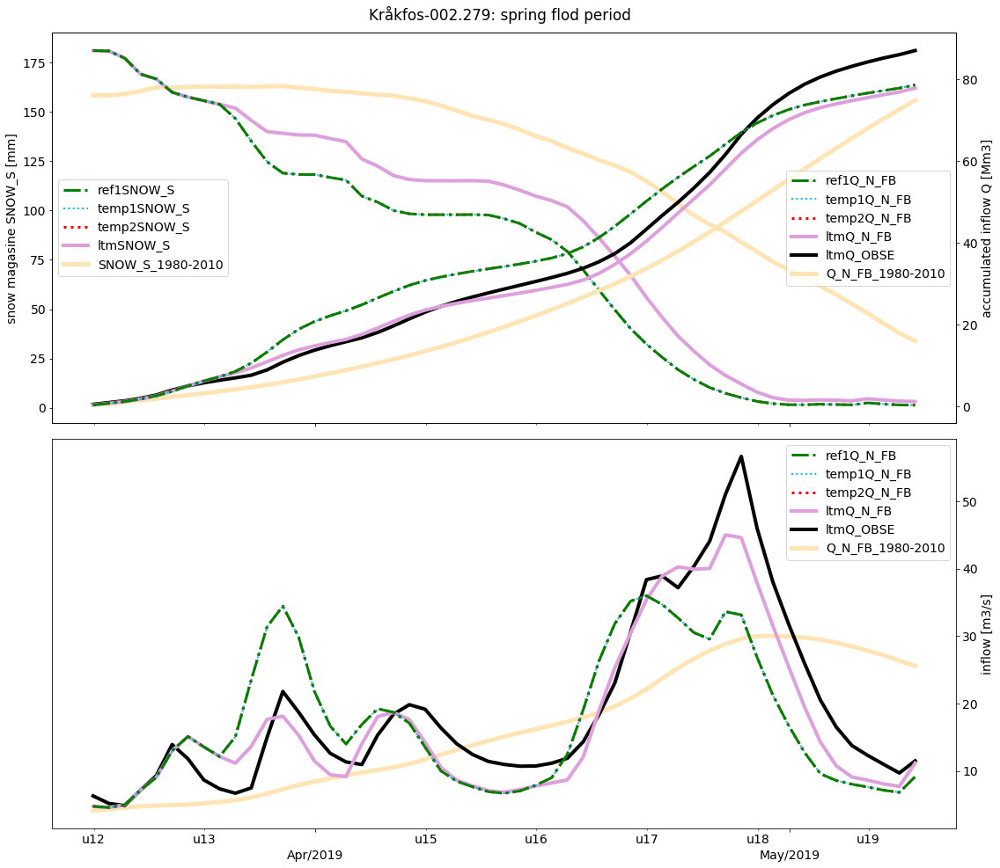


Accumulated performance [percentage deviation]: ref1: -9.65, temp1: -9.65, temp2: -9.65, ltm: -10.54
Profile correlation performance [R2 value]: ]: ref1: 0.53, temp1: 0.53, temp2: 0.53, ltm: 0.89




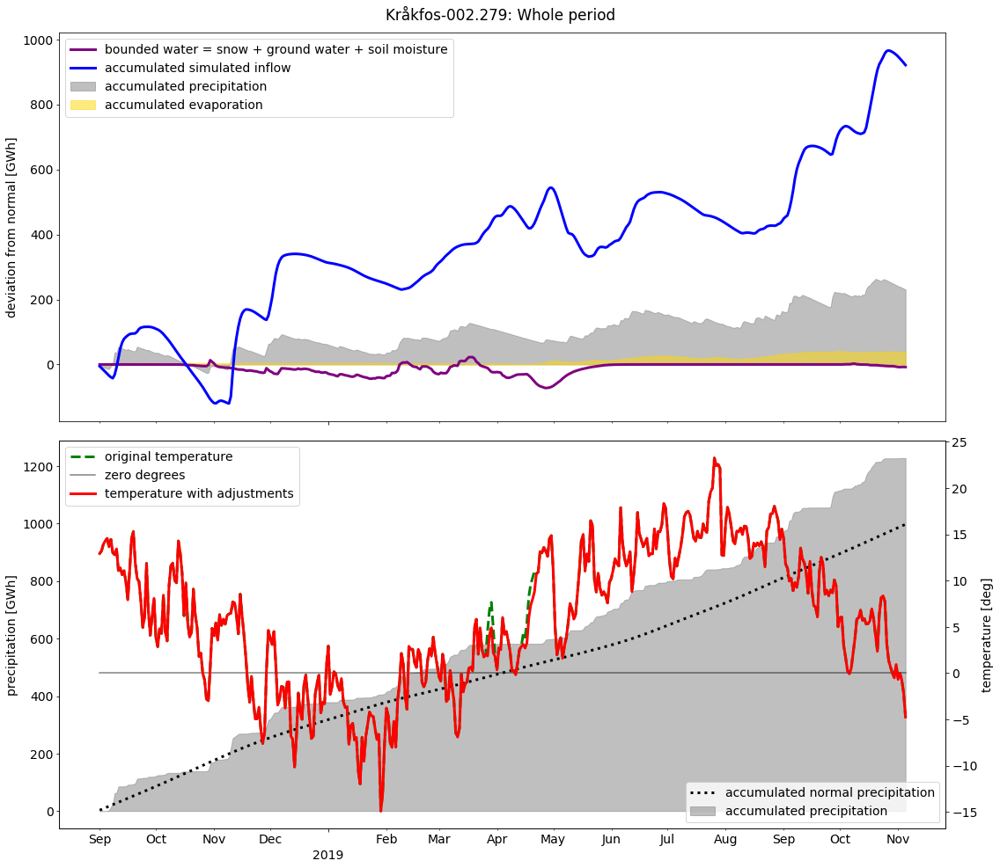

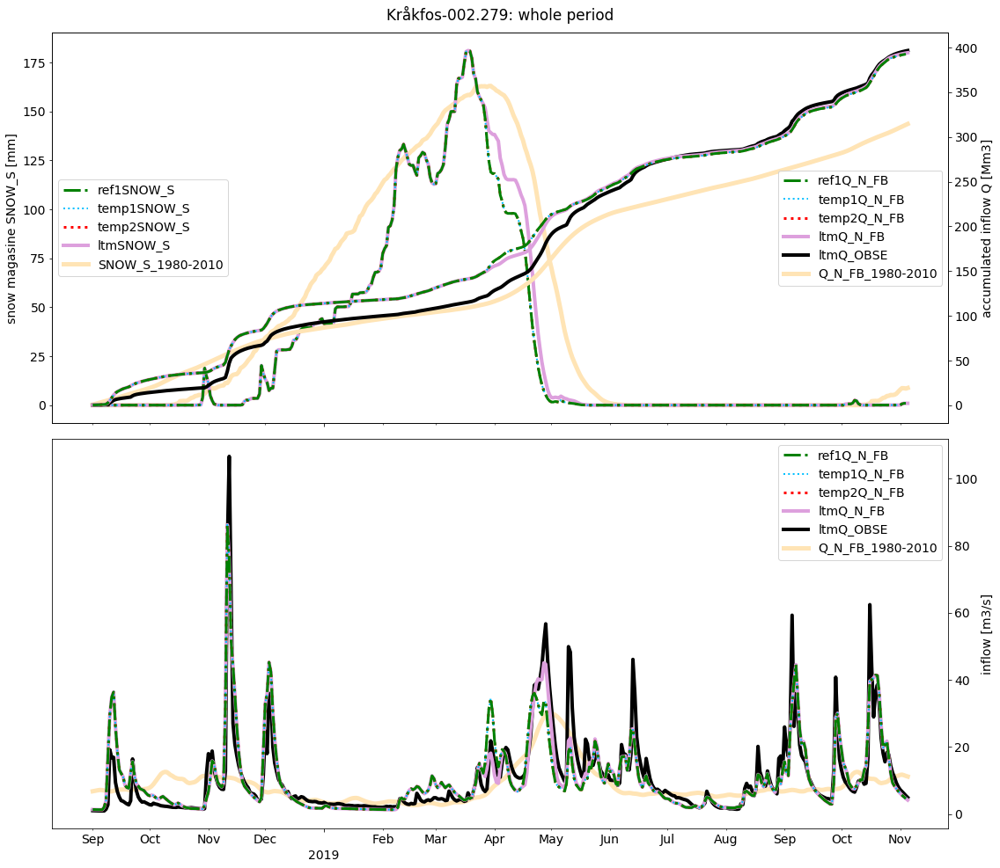








------------------------------------------------------------------------------------------------------------------------
                                                        Liavatn-002.275
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-04-01): Peak of snow magasine for ref inndatasett.
WARNING, end after last day! Analysis end (2019-09-29): this script did not find a sufficient estimation of the end of the spring flod, used here date for the ref snow magasine minimum.


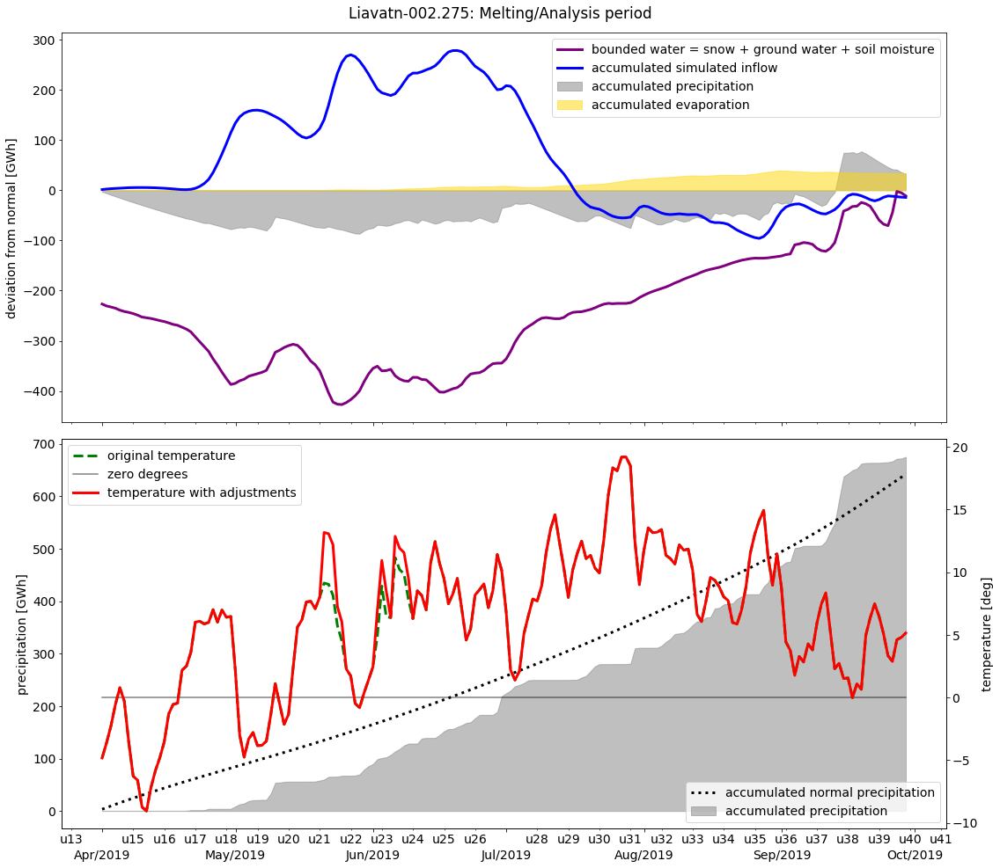

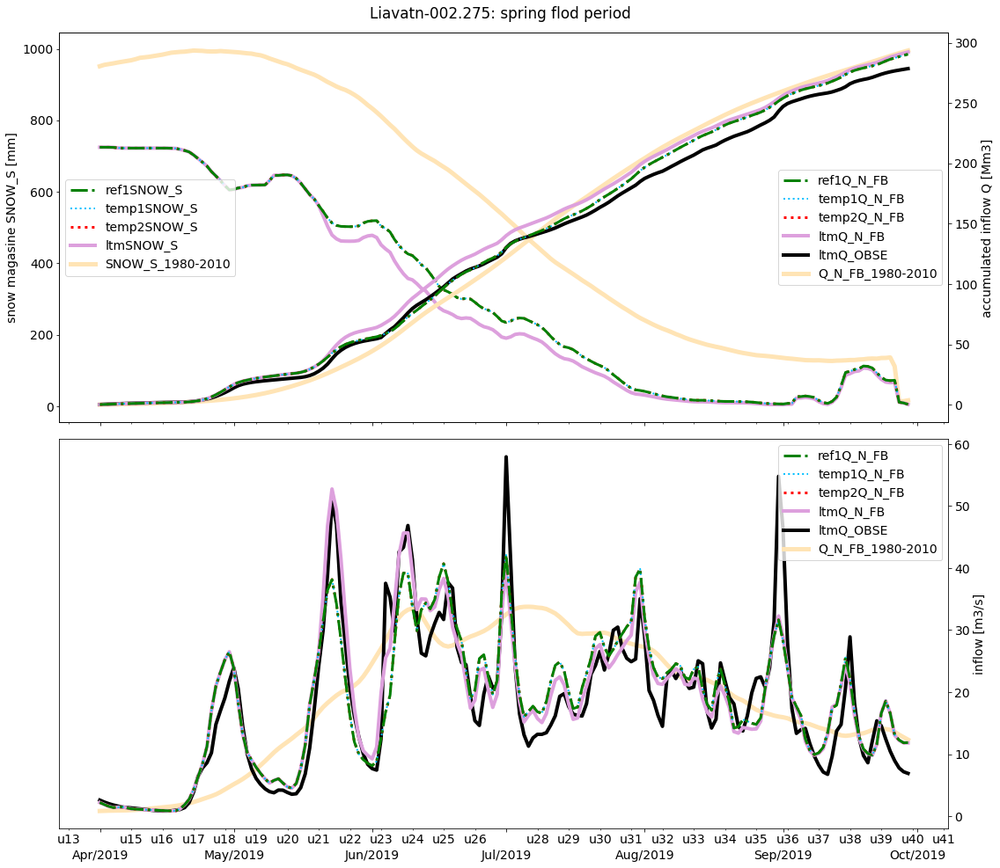


Accumulated performance [percentage deviation]: ref1: 4.29, temp1: 4.29, temp2: 4.29, ltm: 4.94
Profile correlation performance [R2 value]: ]: ref1: 0.81, temp1: 0.81, temp2: 0.81, ltm: 0.85




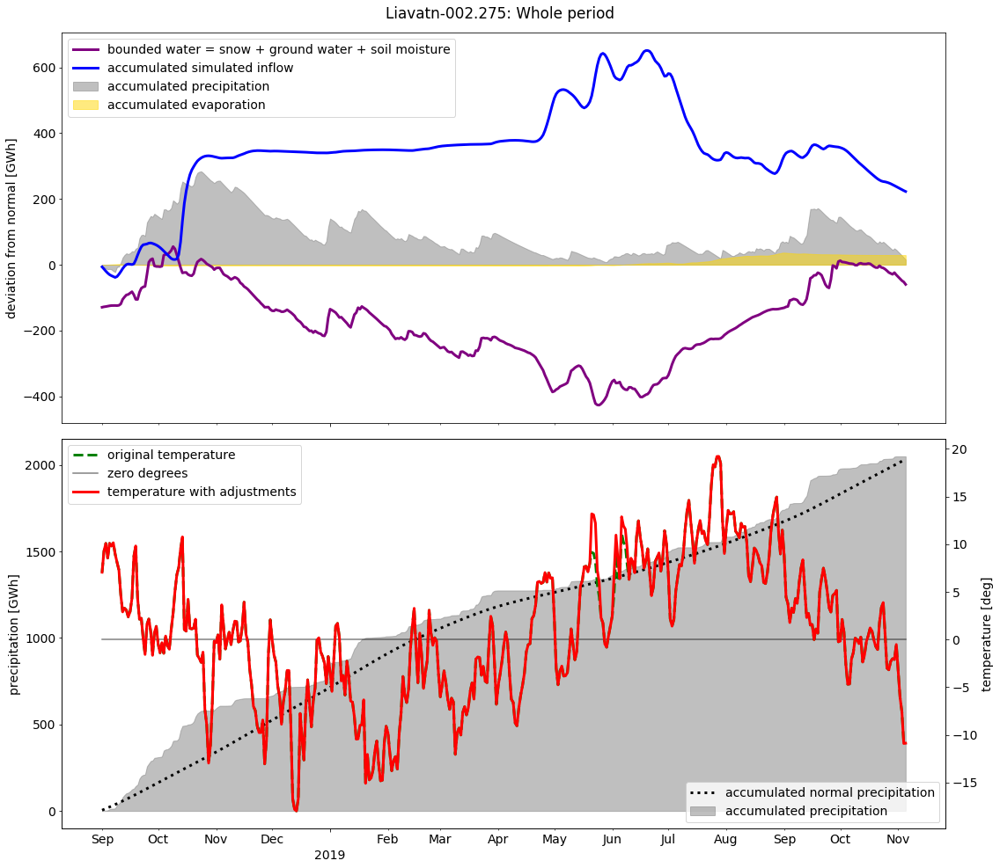

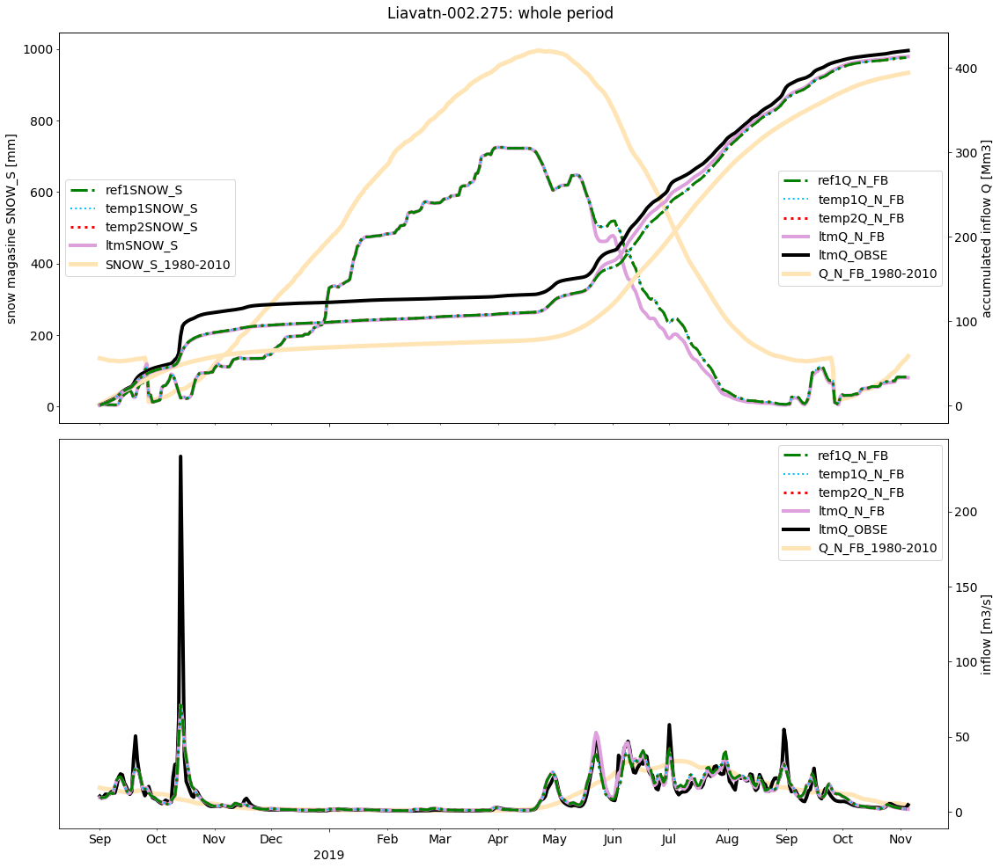








------------------------------------------------------------------------------------------------------------------------
                                                        Magnor-313.010
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-02-12): read from excel.
Analysis end (2019-04-28): First day when the inflow models are close to Q_OBSE, one week after the snow magasine goes under 20 GWh SWE.

Comment from Excel file: "Umulig å gjøre noe med"



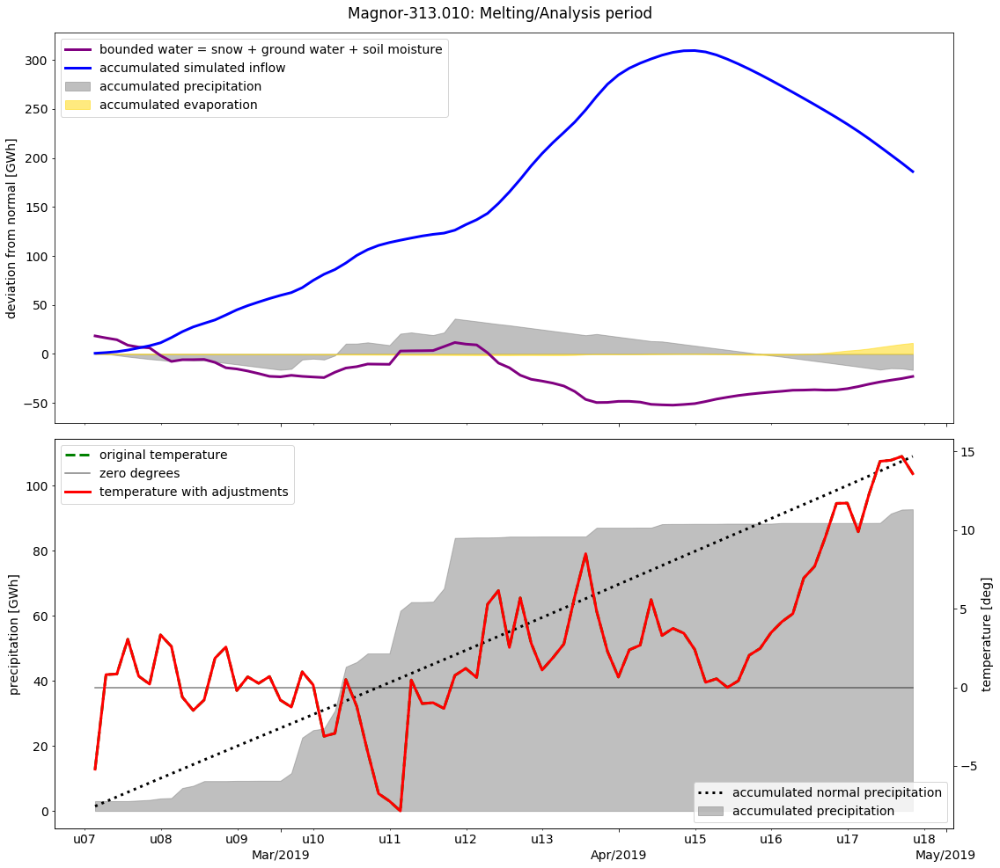

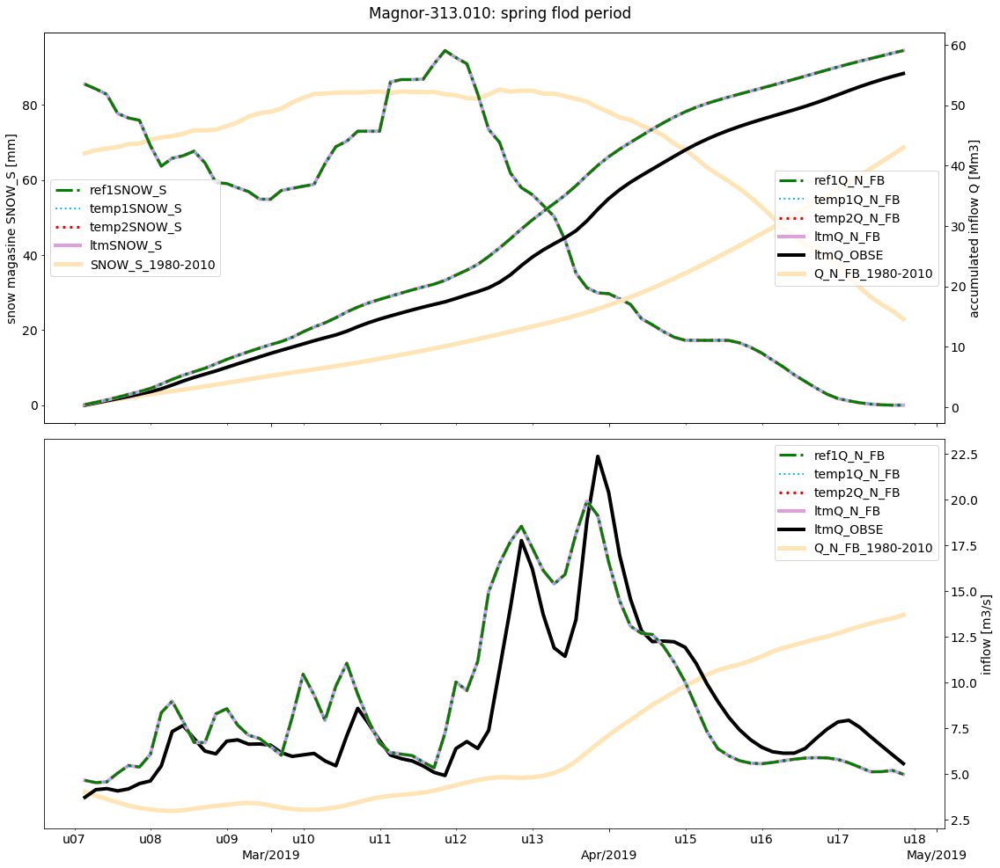


Accumulated performance [percentage deviation]: ref1: 6.89, temp1: 6.89, temp2: 6.89, ltm: 6.89
Profile correlation performance [R2 value]: ]: ref1: 0.66, temp1: 0.66, temp2: 0.66, ltm: 0.66




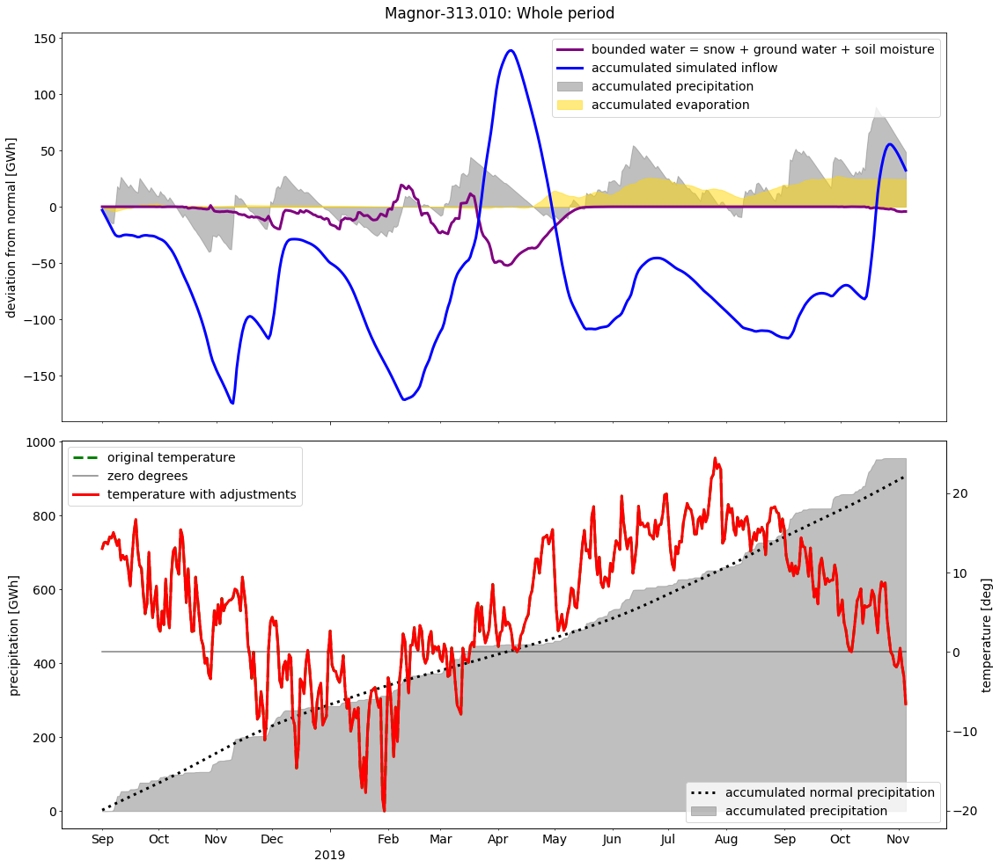

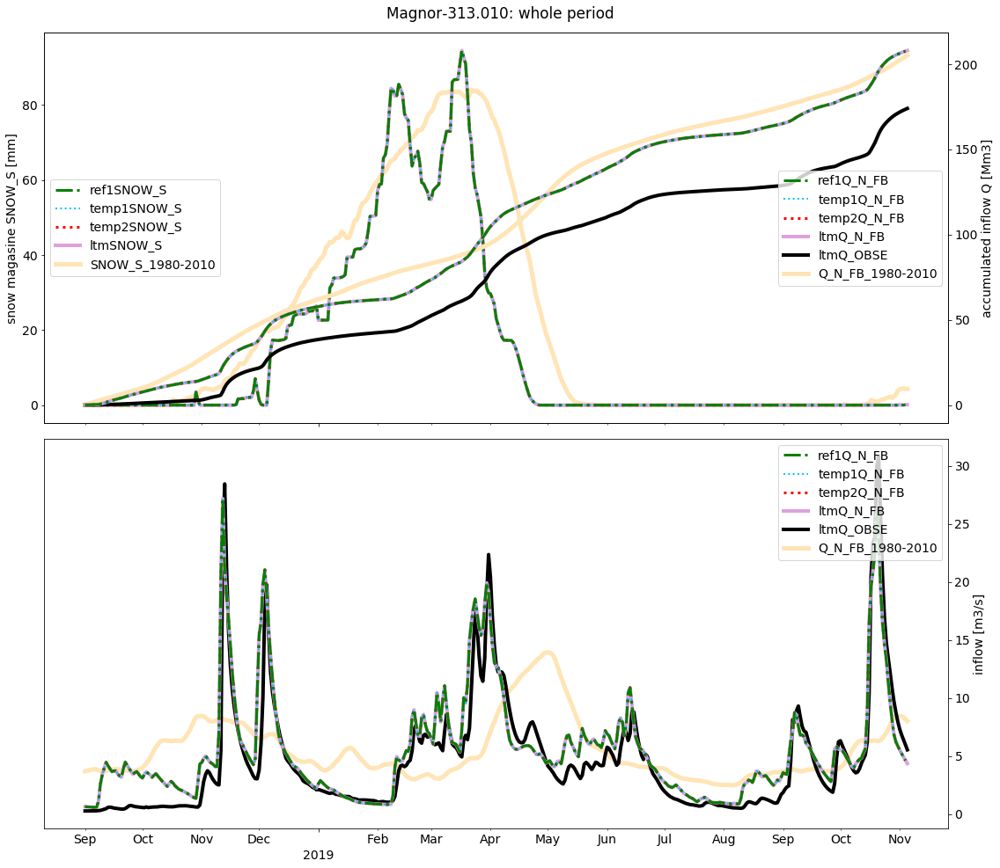








------------------------------------------------------------------------------------------------------------------------
                                                        Narsjø-002.011
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-04-07): Peak of snow magasine for ref inndatasett.
WARNING, end after last day! Analysis end (2019-07-06): this script did not find a sufficient estimation of the end of the spring flod, used here date for the ref snow magasine minimum.


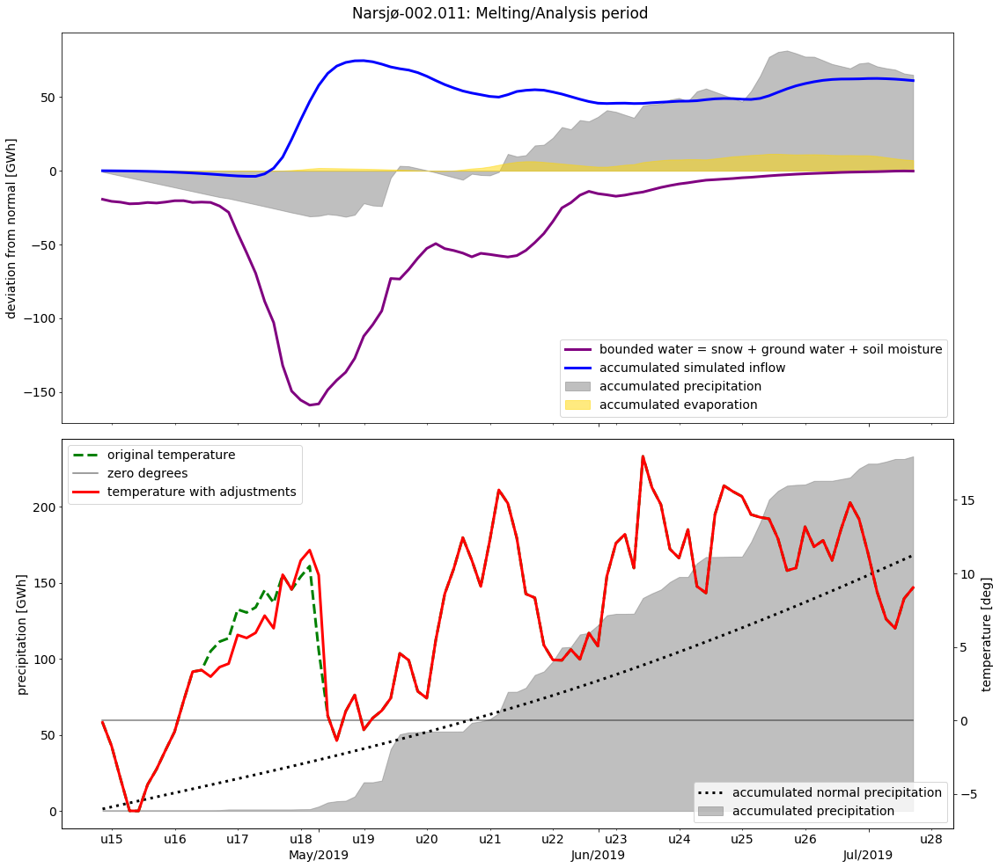

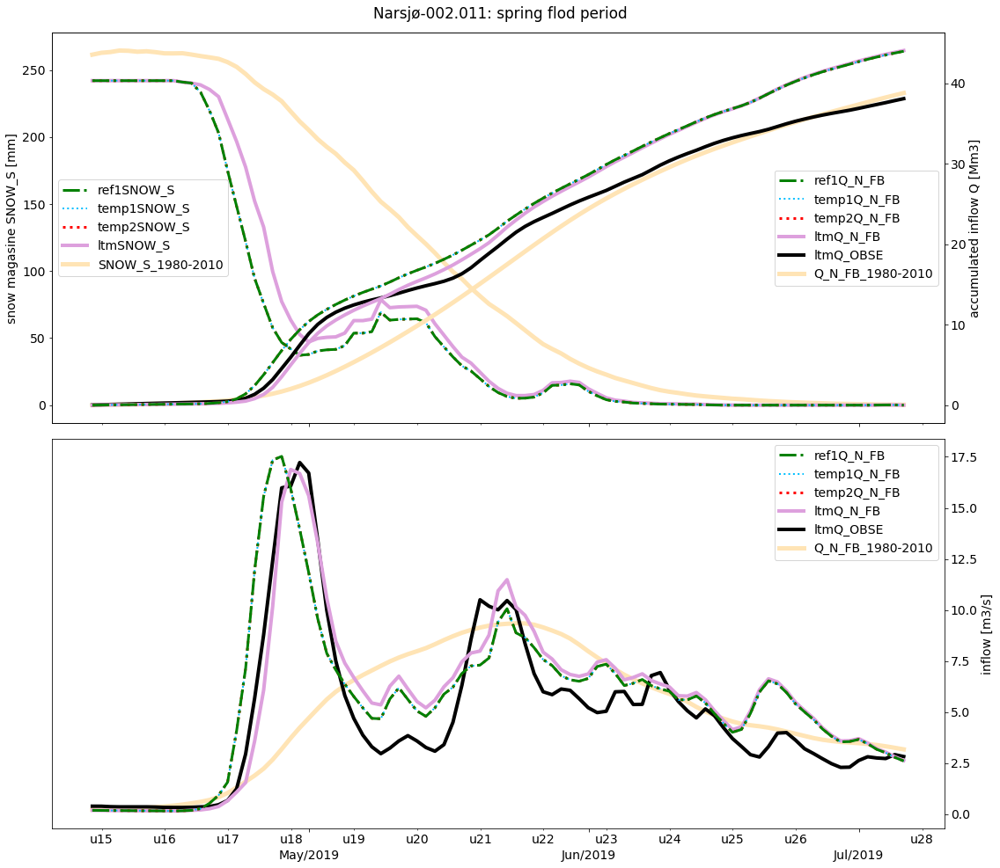


Accumulated performance [percentage deviation]: ref1: 15.46, temp1: 15.46, temp2: 15.46, ltm: 15.69
Profile correlation performance [R2 value]: ]: ref1: 0.75, temp1: 0.75, temp2: 0.75, ltm: 0.85




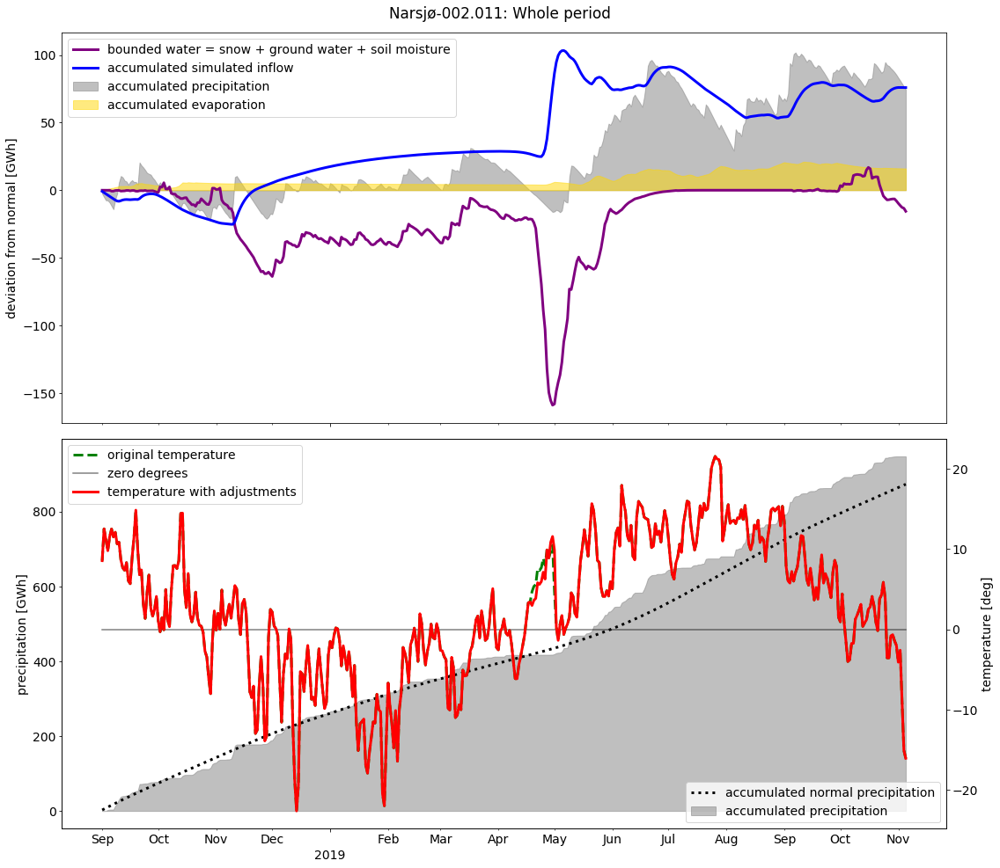

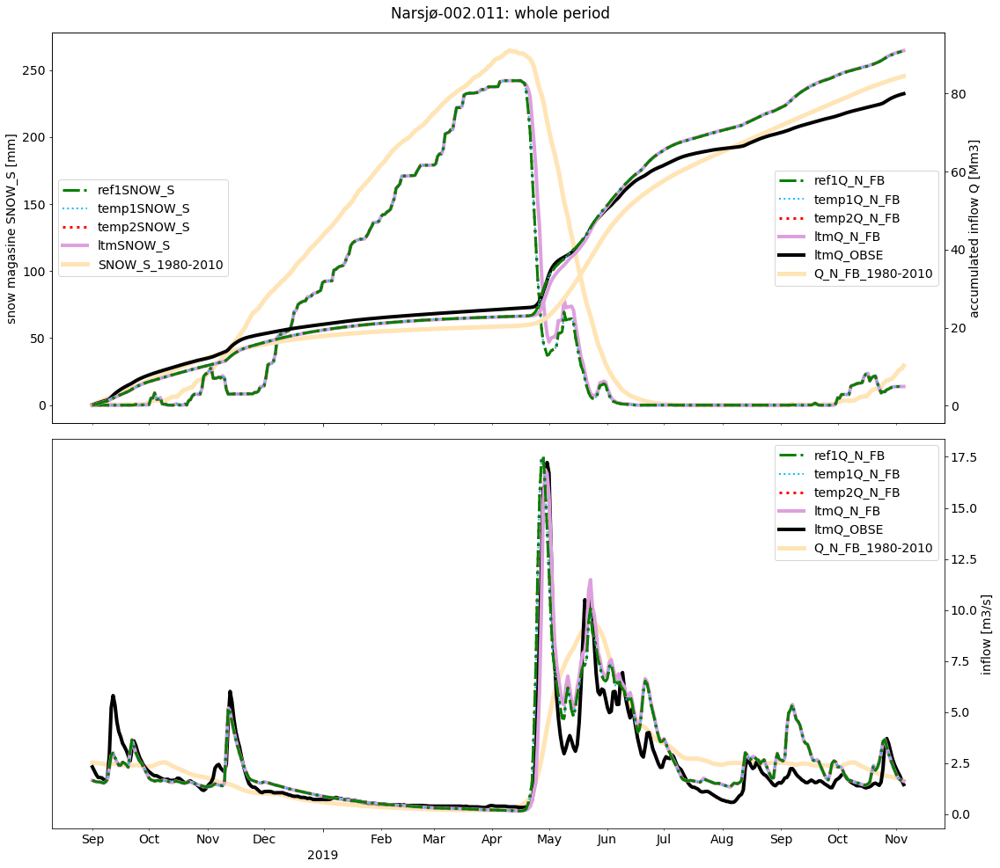








------------------------------------------------------------------------------------------------------------------------
                                                        Nore.1-015.011
------------------------------------------------------------------------------------------------------------------------
Analysis start (2019-03-26): Peak of snow magasine for ref inndatasett.
WARNING, end after last day! Analysis end (2019-07-26): this script did not find a sufficient estimation of the end of the spring flod, used here date for the ref snow magasine minimum.

Comment from Excel file: "Justeringene i løpet av vinteren hadde negativ effekt, for det gav for mye snøvolum, og dette førte til en god del justeringer med forskjellig effekt.Til slutt ble det fjærnet snø, som var en god vurdering. Men det var antagelig for høye tilsigsprognoser gjennom hele vinteren fem til snømagasinet ble justert ned 07/06."



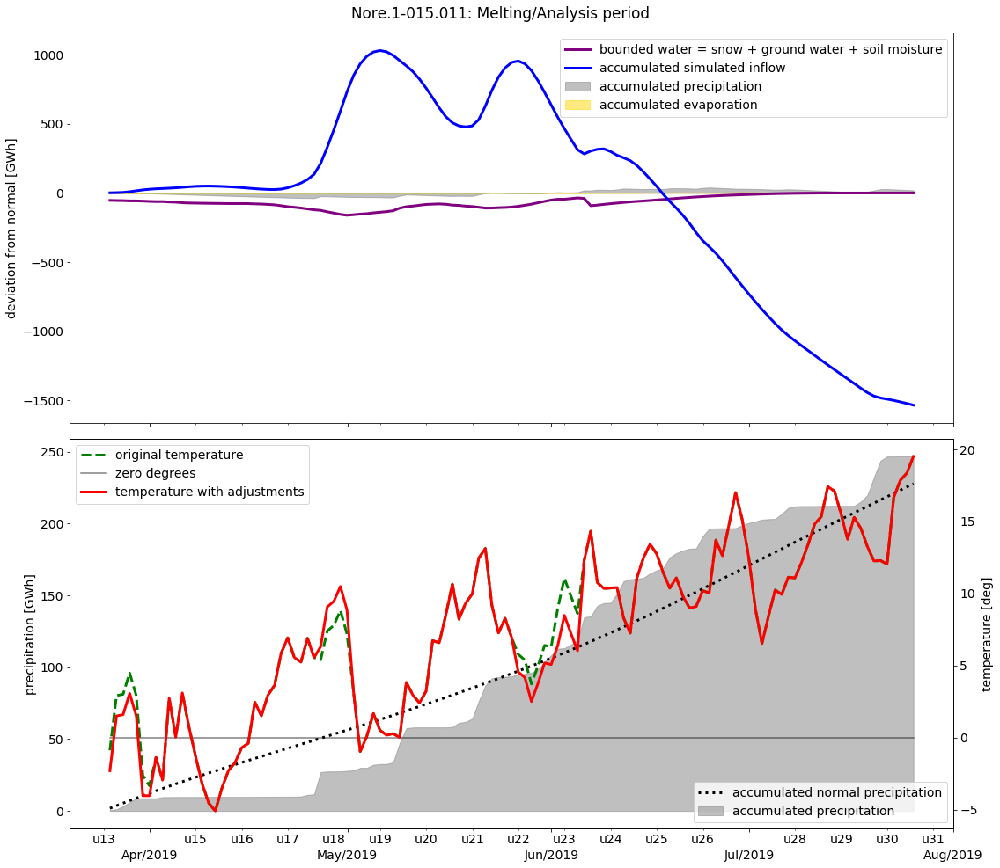

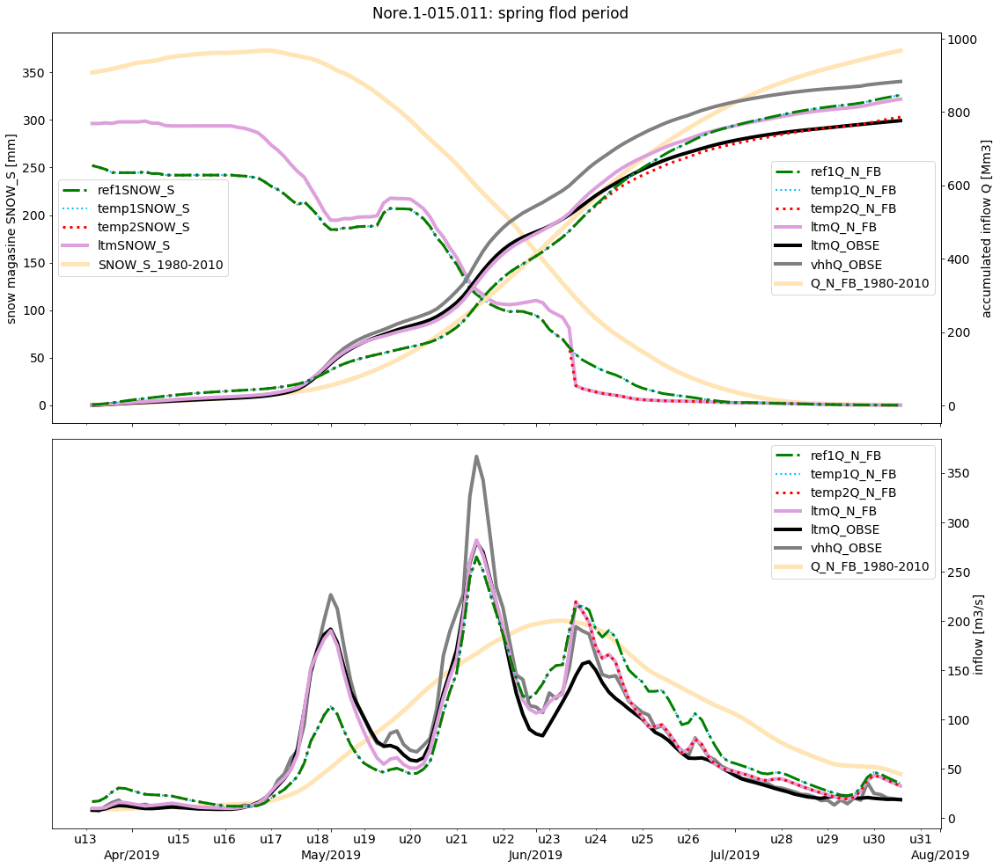


Accumulated performance [percentage deviation]: ref1: 8.97, temp1: 8.97, temp2: 1.26, ltm: 7.57
Profile correlation performance [R2 value]: ]: ref1: 0.76, temp1: 0.76, temp2: 0.82, ltm: 0.95




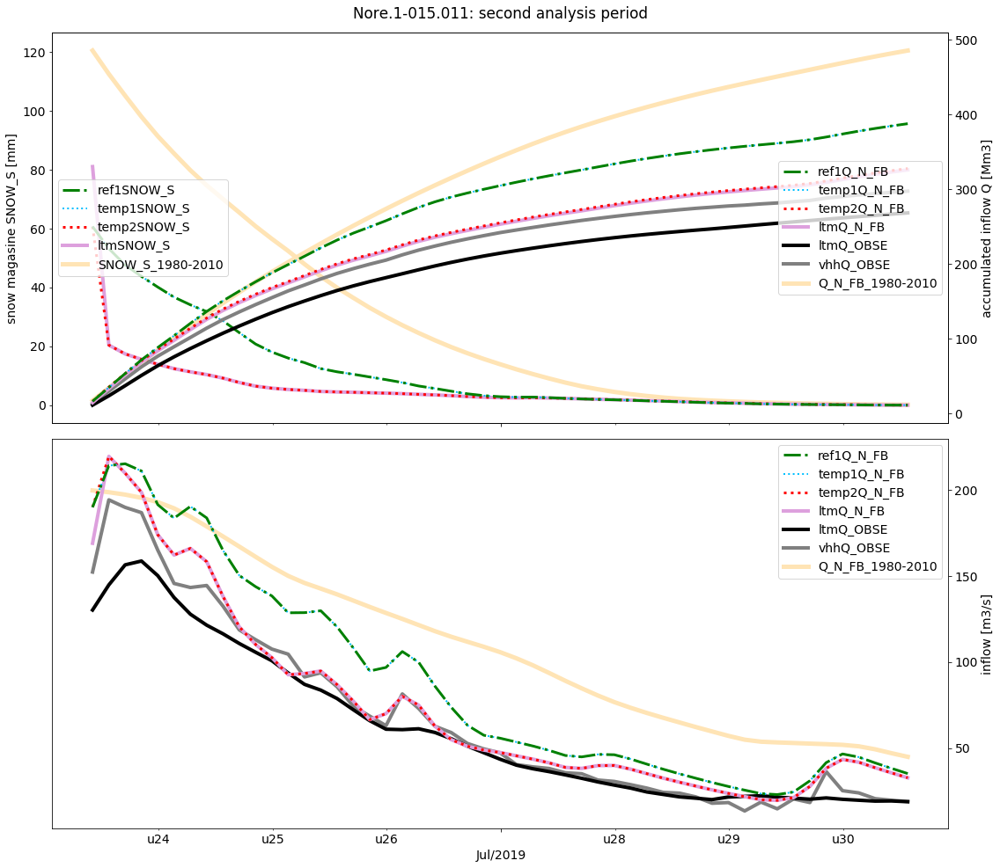

In [ ]:
m.make_all(df_analysis_period, all_df, resources_analysis_period, all_resources, all_keys, start_info_list, end_info_list, sheet, vhhQ_OBSE_list, comments_list, excluded_list, file, df_analysis1_list, start_analysis1_list, df_analysis2_list, start_analysis2_list)